In [1]:
import mysql.connector
import pandas as pd
import matplotlib.pyplot as plt 
import pymysql
import numpy as np
from time import perf_counter
import time
import helper_functions as hf

In [2]:
import os
current_dir = os.getcwd()
print(current_dir)

/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc


# 1. Data 

In [3]:
folder_path = '/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/Sentilink Data'
file_parts = [
    '2024-04-15_sentilink_propelholdings_facets_part_1.csv',
    '2024-04-15_sentilink_propelholdings_facets_part_2.csv',
    '2024-04-15_sentilink_propelholdings_facets_part_3.csv',
    '2024-04-15_sentilink_propelholdings_facets_part_4.csv',
    '2024-04-15_sentilink_propelholdings_facets_part_5.csv',
    '2024-04-15_sentilink_propelholdings_facets_part_6.csv'
]

combined_df = pd.concat([pd.read_csv(os.path.join(folder_path, file)) for file in file_parts])
combined_df.head()

/var/folders/3s/_6crr0fn3yq77k0g_2_fkn00g58sl3/T/ipykernel_30261/1831570863.py:11: DtypeWarning: Columns (2,17,18,20,76,85,86,87,88,89,90,91,92,93,94,95,96,97,102,109,110,112,114,115,116,117,118,120,121,122,123,125,127,128,153,154,155,166,189,206,207,208,209,210,211,238,240,242,243,257,263,264) have mixed types. Specify dtype option on import or set low_memory=False.
  combined_df = pd.concat([pd.read_csv(os.path.join(folder_path, file)) for file in file_parts])
/var/folders/3s/_6crr0fn3yq77k0g_2_fkn00g58sl3/T/ipykernel_30261/1831570863.py:11: DtypeWarning: Columns (2,17,18,20,76,85,109,117,120,121,122,123,125,127,128,153,154,166,189,206,207,208,209,210,211,238,240,243,263,264) have mixed types. Specify dtype option on import or set low_memory=False.
  combined_df = pd.concat([pd.read_csv(os.path.join(folder_path, file)) for file in file_parts])
/var/folders/3s/_6crr0fn3yq77k0g_2_fkn00g58sl3/T/ipykernel_30261/1831570863.py:11: DtypeWarning: Columns (2,17,18,20,76,85,86,87,88,89,90,91,9

,sentilink_application_sid,propelholdings_application_id,address_city_matches_records,address_distance_from_most_recent_on_record_km,address_history_yrs,address_min_distance_from_known_addresses_km,address_num_apps_cluster,address_num_identities_w_address_120d_cluster,address_num_identities_w_address_1y_cluster,address_num_identities_w_address_30d_cluster,...,ssn5_start_minus_dob_yrs,ssn_address_state_mismatch_score,ssn_bogus,ssn_frac_in_ssn_window_w_history,ssn_may_belong_to_a_minor,ssn_num_identities_cluster,ssn_prop_in_window,ssn_random_but_matches_state,zipcode_first_3_matches_manifest,zipcode_matches_manifest
0,H7XDAE-9HDWMD-2T4JTH-P671VN,2565634858,True,26.392402,NaN,4.046947,2.0,0.0,1.0,0.0,...,0.0,0.000000,False,NaN,False,1.0,NaN,NaN,True,True
1,H7XDAD-QQE9N7-BJJ94F-B1KWJ1,2565634856,True,1.909185,NaN,1.909185,5.0,NaN,NaN,NaN,...,NaN,0.000000,False,NaN,False,6.0,NaN,NaN,True,True
2,H7XD9T-PXK5T8-S835BP-G6C23N,2565634759,False,2346.063426,NaN,2.054761,36.0,3.0,4.0,0.0,...,-2.0,0.192993,False,NaN,False,1.0,NaN,NaN,False,False
3,H7XD6R-JKE8VD-RD8425-ADD0Z1,2565634215,True,0.000000,6.535250,0.000000,35.0,2.0,2.0,0.0,...,5.0,1.116071,False,NaN,False,2.0,NaN,NaN,True,True
4,H7XD6G-SMGYV7-4HE63V-5AR5CA,2565634181,True,1498.239721,12.788501,0.000000,34.0,0.0,0.0,0.0,...,16.0,0.070659,False,NaN,False,2.0,NaN,NaN,True,True


In [4]:
combined_df.shape

(5309945, 265)

In [5]:
combined_df

,sentilink_application_sid,propelholdings_application_id,address_city_matches_records,address_distance_from_most_recent_on_record_km,address_history_yrs,address_min_distance_from_known_addresses_km,address_num_apps_cluster,address_num_identities_w_address_120d_cluster,address_num_identities_w_address_1y_cluster,address_num_identities_w_address_30d_cluster,...,ssn5_start_minus_dob_yrs,ssn_address_state_mismatch_score,ssn_bogus,ssn_frac_in_ssn_window_w_history,ssn_may_belong_to_a_minor,ssn_num_identities_cluster,ssn_prop_in_window,ssn_random_but_matches_state,zipcode_first_3_matches_manifest,zipcode_matches_manifest
0,H7XDAE-9HDWMD-2T4JTH-P671VN,2565634858,True,26.392402,NaN,4.046947,2.0,0.0,1.0,0.0,...,0.0,0.000000,False,NaN,False,1.0,NaN,NaN,True,True
1,H7XDAD-QQE9N7-BJJ94F-B1KWJ1,2565634856,True,1.909185,NaN,1.909185,5.0,NaN,NaN,NaN,...,NaN,0.000000,False,NaN,False,6.0,NaN,NaN,True,True
2,H7XD9T-PXK5T8-S835BP-G6C23N,2565634759,False,2346.063426,NaN,2.054761,36.0,3.0,4.0,0.0,...,-2.0,0.192993,False,NaN,False,1.0,NaN,NaN,False,False
3,H7XD6R-JKE8VD-RD8425-ADD0Z1,2565634215,True,0.000000,6.535250,0.000000,35.0,2.0,2.0,0.0,...,5.0,1.116071,False,NaN,False,2.0,NaN,NaN,True,True
4,H7XD6G-SMGYV7-4HE63V-5AR5CA,2565634181,True,1498.239721,12.788501,0.000000,34.0,0.0,0.0,0.0,...,16.0,0.070659,False,NaN,False,2.0,NaN,NaN,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
884990,HT15QG-VC2Q2B-STGWPT-E9YGAP,2616924126,True,0.000000,2.075291,0.000000,12.0,0.0,0.0,0.0,...,15.0,0.000000,False,NaN,False,1.0,NaN,NaN,True,True
884991,HT15GQ-XZWT7X-021MDZ-Q3TKBZ,2616923613,True,3540.983206,10.488706,0.000000,8.0,0.0,0.0,0.0,...,17.0,0.000000,False,NaN,False,4.0,NaN,NaN,True,True
884992,HT15GP-S72VD1-F8CJV0-15E823,2616923622,True,NaN,NaN,NaN,29.0,0.0,0.0,0.0,...,16.0,0.000000,False,NaN,NaN,2.0,NaN,NaN,False,True
884993,HT156X-0WTXFJ-EGX5FR-VCR6RB,2616922883,True,11.075819,2.075291,0.000000,8.0,0.0,0.0,0.0,...,6.0,0.070659,False,NaN,False,4.0,NaN,NaN,True,True


In [ ]:
## dont run
def identify_date_columns(df):
    date_columns = []
    for col in df.columns:
        if 'date' in col.lower() or 'time' in col.lower() or 'year' in col.lower():
            date_columns.append(col)
        else:
            try:
                if pd.to_datetime(df[col], errors='coerce').notna().any():
                    date_columns.append(col)
            except Exception:
                continue
    return date_columns

date_columns = identify_date_columns(combined_df)
print(date_columns)

^^^ not needed since we have propelholdings_application_id == lead_sequence_id

In [6]:
def find_max_min_application_id(df, column_name):
    if column_name in df.columns:
        max_value = df[column_name].max()
        min_value = df[column_name].min()
        return max_value, min_value
    else:
        return None, None
    
max_id, min_id = find_max_min_application_id(combined_df, 'propelholdings_application_id')
print(f"Max lsid: {max_id}")
print(f"Min lsid: {min_id}")

Max lsid: 2617618360
Min lsid: 2562747526


In [6]:
combined_df.rename(columns={'propelholdings_application_id': 'lead_sequence_id'}, inplace=True)

In [ ]:
## dont run
conn= mysql.connector.connect(option_files='.my.cnf', option_groups = 'mysqlconnection',use_pure=True ,
                              auth_plugin='mysql_native_password')
limit = 2612698770 ##2617618360 ## max
difference = 100000
lower = 2575865769 ##2562747526 ## min
upper = lower+difference
i=0
timestart = time.time()
while lower <= limit:
    time0=time.time()
    temp = pd.read_sql("""
    SELECT a.lead_sequence_id, a.decision, if(la.origination_loan_id is not null, 1, 0) as isorigination
    FROM datawork.mk_application a
    left join dwh.rpt_leads_accepted la on a.lead_sequence_id = la.lead_sequence_id
    WHERE a.lead_sequence_id > """ + str(lower) + """
    AND a.lead_sequence_id <= """ + str(upper) + """ 
    ;""", con=conn)
    lower = lower + difference
    upper = upper + difference
    if i==0:
        leads_a = temp.copy()
    else:
        leads_a = pd.concat([leads_a, temp], ignore_index=True)
    i+=1    
    print(time.time()-time0)
    print(temp.shape)
    print("lower:",lower)
conn.close()
print('total time: ', time.time()-timestart)

## 1.1 Internal/Propel Data 

In [7]:
iters=300
conn= mysql.connector.connect(option_files='.my.cnf', option_groups = 'mysqlconnection', use_pure=True,
                              auth_plugin='mysql_native_password')
for i in range(iters):
    time1=time.time()
    temp =  pd.read_sql("""
    SELECT a.lead_sequence_id, a.decision, if(la.origination_loan_id is not null, 1, 0) as isorigination
    FROM datawork.mk_application a
    left join dwh.rpt_leads_accepted la on a.lead_sequence_id = la.lead_sequence_id
    WHERE a.lead_sequence_id in """ + str(tuple(combined_df.lead_sequence_id[(i*np.floor(len(combined_df)/iters)).astype(int):((i+1)*np.floor(len(combined_df)/iters)).astype(int)].to_list())) + """
    ;""", con = conn)
    print(time.time()-time1)
    print(i)
    print(temp.shape)
    if i==0:
        internal_df = temp.copy()
    else:
        internal_df = pd.concat([internal_df, temp], ignore_index=True)

/var/folders/3s/_6crr0fn3yq77k0g_2_fkn00g58sl3/T/ipykernel_30261/2072360920.py:6: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  temp =  pd.read_sql("""


2.24535870552063
0
(17699, 3)
1.3834030628204346
1
(17694, 3)
2.5558409690856934
2
(17699, 3)
2.2451398372650146
3
(17699, 3)
2.53368878364563
4
(17699, 3)
2.794301748275757
5
(17699, 3)
2.58193302154541
6
(17699, 3)
2.4423251152038574
7
(17699, 3)
2.343485116958618
8
(17699, 3)
2.1347978115081787
9
(17699, 3)
1.7354860305786133
10
(17699, 3)
1.6749897003173828
11
(17699, 3)
1.4259512424468994
12
(17699, 3)
1.495265007019043
13
(17660, 3)
1.5308921337127686
14
(17672, 3)
1.4575228691101074
15
(17692, 3)
1.495736837387085
16
(17699, 3)
2.4365127086639404
17
(17698, 3)
4.7687668800354
18
(17698, 3)
5.672119140625
19
(17666, 3)
5.51235294342041
20
(17699, 3)
4.418816089630127
21
(17698, 3)
4.369715929031372
22
(17699, 3)
3.785487174987793
23
(17698, 3)
4.483760118484497
24
(17643, 3)
3.454740047454834
25
(17693, 3)
3.7333312034606934
26
(17693, 3)
3.8746590614318848
27
(17653, 3)
3.518921136856079
28
(17694, 3)
3.302206039428711
29
(17699, 3)
3.634950876235962
30
(17699, 3)
3.768961191177

2.18837308883667
249
(17699, 3)
2.442133903503418
250
(17698, 3)
2.2516329288482666
251
(17699, 3)
2.078174114227295
252
(17698, 3)
1.9555118083953857
253
(17699, 3)
2.5341060161590576
254
(17671, 3)
2.6670162677764893
255
(17696, 3)
2.321362018585205
256
(17698, 3)
2.524965286254883
257
(17684, 3)
2.6072561740875244
258
(17657, 3)
2.3379170894622803
259
(17698, 3)
2.2208237648010254
260
(17677, 3)
2.169429063796997
261
(17659, 3)
2.0043020248413086
262
(17682, 3)
1.876499891281128
263
(17666, 3)
1.9826021194458008
264
(17693, 3)
1.8152577877044678
265
(17692, 3)
1.8130898475646973
266
(17695, 3)
1.8372058868408203
267
(17699, 3)
1.8423659801483154
268
(17698, 3)
1.762394905090332
269
(17698, 3)
2.9918758869171143
270
(17697, 3)
2.786202907562256
271
(17699, 3)
3.0363590717315674
272
(17572, 3)
2.8349509239196777
273
(17691, 3)
2.4077320098876953
274
(17697, 3)
2.8015987873077393
275
(17699, 3)
2.443742036819458
276
(17699, 3)
1.9994752407073975
277
(17699, 3)
1.588912010192871
278
(17

#### Merge internal and sentilink 

In [8]:
merged_df = pd.merge(combined_df, internal_df, on='lead_sequence_id')
merged_df.shape

(5308343, 267)

#### Get fpd data from the merged_df (Use isFPD as the main metric for analysis) 

In [10]:
fpd_df = hf.get_more_fpd(merged_df)

We will excecute 530 iterations:



/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.7677178382873535


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2706718444824219


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3101108074188232


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3966331481933594


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3755857944488525


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.363591194152832


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5477962493896484


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6099839210510254


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4133970737457275


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3710789680480957


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3687140941619873


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2787730693817139


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2747178077697754


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4468960762023926


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5110509395599365


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1834430694580078


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3695909976959229


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3957457542419434


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4604029655456543


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2276031970977783


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2666001319885254


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2828760147094727


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0218958854675293


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1163570880889893


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2643601894378662


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1756727695465088


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.239682912826538


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3406331539154053


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0178589820861816


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9837298393249512


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.8860142230987549


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1405560970306396


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1980819702148438


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2185232639312744


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1580109596252441


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.28420090675354


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2759428024291992


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2008843421936035


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3721978664398193


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4749059677124023


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3756370544433594


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4576261043548584


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4836609363555908


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3882570266723633


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2809851169586182


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2551181316375732


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3697998523712158


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2630388736724854


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3983521461486816


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2842841148376465


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.351261854171753


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1649971008300781


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2419369220733643


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2658770084381104


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2930090427398682


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2196929454803467


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2509417533874512


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1355922222137451


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.044313669204712


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1720597743988037


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2911951541900635


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0891010761260986


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2027208805084229


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1689260005950928


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9489908218383789


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0504930019378662


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0686447620391846


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1080639362335205


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1690471172332764


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3167979717254639


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1568498611450195


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1621131896972656


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.150395154953003


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1872620582580566


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.09859299659729


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1586806774139404


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1509180068969727


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1678440570831299


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1720540523529053


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.066011905670166


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1084997653961182


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0590291023254395


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1879229545593262


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.148669958114624


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1709964275360107


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1257457733154297


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.138573169708252


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1790080070495605


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1755006313323975


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2612669467926025


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1293091773986816


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2166492938995361


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.09287691116333


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1669609546661377


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1316649913787842


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1262719631195068


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1052029132843018


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.11297607421875


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1783621311187744


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1764070987701416


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0659081935882568


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0621037483215332


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1165339946746826


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1098508834838867


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0876657962799072


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0418670177459717


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0015928745269775


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0459246635437012


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9637517929077148


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9392650127410889


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.117685079574585


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1586270332336426


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1900391578674316


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0591931343078613


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9542920589447021


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2531943321228027


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0612196922302246


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0787558555603027


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0948166847229004


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0400209426879883


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1311211585998535


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0674681663513184


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0584750175476074


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0876069068908691


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.8819148540496826


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1808929443359375


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1635468006134033


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.154721975326538


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.149195909500122


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1921031475067139


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1782729625701904


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2920677661895752


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2289960384368896


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.21134614944458


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.121863842010498


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.077099084854126


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2881369590759277


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3691179752349854


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.196615219116211


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3339672088623047


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.135195016860962


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1018896102905273


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1683247089385986


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2526888847351074


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2127890586853027


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1642587184906006


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0462660789489746


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9850633144378662


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9958043098449707


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3815250396728516


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2638747692108154


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.187479019165039


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.8925509452819824


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1530070304870605


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0756888389587402


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.403141975402832


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2116529941558838


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1166579723358154


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9898769855499268


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9763069152832031


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1877031326293945


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4906871318817139


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1420049667358398


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3100066184997559


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9683387279510498


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9099199771881104


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1075770854949951


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4812989234924316


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1981189250946045


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.150428056716919


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.989393949508667


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9110989570617676


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0381720066070557


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4344029426574707


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2724568843841553


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2632269859313965


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2082171440124512


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9490847587585449


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0262467861175537


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4700329303741455


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1976041793823242


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.231877088546753


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.114954948425293


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9302198886871338


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9283850193023682


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3640258312225342


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4665701389312744


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2360711097717285


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.172318935394287


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0026061534881592


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9308359622955322


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0508718490600586


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3232638835906982


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2563741207122803


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3225820064544678


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1153550148010254


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9943571090698242


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9512310028076172


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9875450134277344


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1916937828063965


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2381608486175537


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1341159343719482


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1572108268737793


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0513432025909424


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9594728946685791


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.8457601070404053


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1933319568634033


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4774830341339111


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1398069858551025


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3705720901489258


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.173172950744629


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9251613616943359


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6535539627075195


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.884963035583496


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.9356000423431396


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.7705130577087402


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.7025840282440186


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6732828617095947


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5879390239715576


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.7892918586730957


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.657026767730713


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5142168998718262


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.312633991241455


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4790573120117188


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5651659965515137


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.7671551704406738


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.738584041595459


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5431489944458008


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3745222091674805


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5089459419250488


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5218639373779297


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5270168781280518


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.7522809505462646


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5450620651245117


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3665821552276611


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3811957836151123


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.352729082107544


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3672199249267578


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3056042194366455


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6484880447387695


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5239439010620117


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5195090770721436


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5319030284881592


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.531527042388916


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5284779071807861


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.561551809310913


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5167217254638672


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5808501243591309


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5088989734649658


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.7281391620635986


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6523220539093018


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.667701005935669


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6362569332122803


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6719160079956055


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6003179550170898


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.692284107208252


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6178770065307617


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6800110340118408


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.615630865097046


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.665055274963379


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.340667724609375


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2929253578186035


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.167891025543213


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2154350280761719


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3623528480529785


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6467888355255127


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5016849040985107


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4920918941497803


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.317108392715454


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5759780406951904


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2558989524841309


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2858831882476807


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4463660717010498


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.328566074371338


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2989768981933594


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.323096752166748


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  1
Runtime:  1.3055667877197266


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3899381160736084


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4678981304168701


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5725767612457275


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4850752353668213


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.565309762954712


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5636260509490967


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4823899269104004


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.351593017578125


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1474089622497559


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1196017265319824


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1817169189453125


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2486469745635986


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3443379402160645


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3269670009613037


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3029251098632812


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5102849006652832


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5335280895233154


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6194350719451904


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.7784693241119385


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6718688011169434


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.50431489944458


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5613491535186768


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5981402397155762


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.51389741897583


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4711718559265137


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5399601459503174


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4917092323303223


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5111510753631592


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6139190196990967


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5493860244750977


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5219528675079346


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5551059246063232


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5649361610412598


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.615699052810669


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.522583246231079


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.465717077255249


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5785820484161377


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5135090351104736


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5025899410247803


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4932169914245605


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5440778732299805


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.8443310260772705


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.0571188926696777


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.054663896560669


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.8373439311981201


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6553459167480469


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6205010414123535


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4568986892700195


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5575389862060547


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4961516857147217


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5631680488586426


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5319781303405762


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5237600803375244


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3366951942443848


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4158997535705566


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3757891654968262


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.247260332107544


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.230133056640625


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2009861469268799


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2272300720214844


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5883018970489502


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3148601055145264


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2217822074890137


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2024009227752686


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1104979515075684


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.196828842163086


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3381290435791016


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2259588241577148


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2747910022735596


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3046448230743408


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1076688766479492


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0389468669891357


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2562451362609863


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0787479877471924


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2591311931610107


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2263462543487549


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2215380668640137


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.084409236907959


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2991716861724854


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1868557929992676


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2342572212219238


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0707809925079346


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2145469188690186


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1530191898345947


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1360299587249756


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3291242122650146


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1322071552276611


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2467656135559082


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.05515718460083


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1349141597747803


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1090669631958008


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1120450496673584


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1515891551971436


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0255382061004639


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3265349864959717


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6452817916870117


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6438040733337402


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5282189846038818


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5458309650421143


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5385010242462158


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.550469160079956


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6442489624023438


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6083190441131592


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6180768013000488


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6570308208465576


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5544750690460205


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5976545810699463


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.539196252822876


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5860321521759033


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6606547832489014


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5397911071777344


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6983850002288818


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5908050537109375


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.589015007019043


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5065147876739502


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3694210052490234


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.349146842956543


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5836882591247559


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6192259788513184


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5099949836730957


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4885709285736084


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5235059261322021


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5408811569213867


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4982080459594727


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5894591808319092


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.562204122543335


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6361641883850098


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5995337963104248


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6008110046386719


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.7275080680847168


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.695659875869751


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6381981372833252


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6260349750518799


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.7737398147583008


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5778920650482178


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.695307970046997


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.7384209632873535


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.7230181694030762


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5514769554138184


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5570590496063232


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6080219745635986


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.527994155883789


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.579939842224121


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5248298645019531


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4583332538604736


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3259947299957275


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0284137725830078


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2518739700317383


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3386340141296387


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2092111110687256


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.279829978942871


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4032173156738281


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3534631729125977


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.317983865737915


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2557311058044434


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1991398334503174


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3412580490112305


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.315258264541626


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2591450214385986


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.157439947128296


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1108160018920898


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2354729175567627


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1591641902923584


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.151360034942627


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1716690063476562


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.115304946899414


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1769123077392578


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0246081352233887


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9965438842773438


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9523427486419678


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.8771519660949707


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9135470390319824


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.246293067932129


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2437241077423096


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3920187950134277


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1690940856933594


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1772301197052002


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0493566989898682


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.234010934829712


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3149290084838867


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3352992534637451


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  9.009199142456055


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9328110218048096


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1297228336334229


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2679839134216309


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.336583137512207


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4505648612976074


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4984140396118164


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.718986988067627


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5870587825775146


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5837781429290771


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6787588596343994


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6618149280548096


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.682992935180664


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6326141357421875


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6359663009643555


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.565359115600586


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5113999843597412


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6805686950683594


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.49045991897583


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5886008739471436


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4259390830993652


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3962528705596924


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2656712532043457


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3325250148773193


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6432561874389648


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.44309401512146


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3458521366119385


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1096410751342773


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.8917148113250732


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0731329917907715


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0795960426330566


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0199370384216309


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.017380952835083


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9677259922027588


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.7490119934082031


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.6589739322662354


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.5904309749603271


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.6193830966949463


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.5360958576202393


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.7030620574951172


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1692028045654297


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2190840244293213


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3150568008422852


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2156569957733154


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.335949182510376


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.558833122253418


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.7604238986968994


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6378870010375977


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.8634212017059326


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.8705568313598633


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.9652988910675049


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.01477313041687


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.0835602283477783


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.000112771987915


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.9579949378967285


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.0035243034362793


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.9894299507141113


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.008782148361206


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.0206966400146484


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.020927906036377


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.0651111602783203


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.088844060897827


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.111175060272217


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.9883458614349365


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.9711711406707764


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.9708569049835205


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.9522230625152588


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.9356889724731445


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.9816129207611084


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0892860889434814


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.7484228610992432


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.6430408954620361


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.768883228302002


In [11]:
fpd_df = fpd_df[fpd_df['isFPD'] != 2]
fpd_df.shape

(73978, 10)

## 1.2 Get Ever_30dpd_in_90 data 

In [12]:
pd.options.mode.use_inf_as_na = True
days_since_origination = 90
dpd_days = 30

/var/folders/3s/_6crr0fn3yq77k0g_2_fkn00g58sl3/T/ipykernel_30261/3684431059.py:1: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  pd.options.mode.use_inf_as_na = True


In [13]:
# NC MK loans originated in 2023 Q3 to 2024 Q2 (Start +1 month for both) 
##Change origination_time range to alter date range & org_id***
conn= mysql.connector.connect(option_files='.my.cnf', option_groups = 'mysqlconnection',use_pure=True ,
                              auth_plugin='mysql_native_password')
data_90 = pd.read_sql("""select
                            lbl.base_loan_id,
                            a.lead_provider_name,
                            llh.lead_sequence_id,
                            la.origination_time,
                            llh.entity_name,
                            lpsi.payment_schedule_item_id,
                            lpsi.item_date,
                            lpsi.item_type,
                            lpsi.status as payment_status,
                            lpsi.total_amount,
                            lps.payment_schedule_id,
                            #TIMESTAMPDIFF(DAY, la.origination_time, CURDATE()) AS days_since_origination,
                            TIMESTAMPDIFF(DAY, la.origination_time, lpsi.item_date) AS payment_days_since_origination,
                            lbl.loan_amount, 
                            a.UW_STREAM_ID,
                            la.pay_frequency,
                            (select if(lpsi2.status in ('Return', 'MISSED'), 1, 0) from jaglms.lms_payment_schedule_items lpsi2
                            where lpsi2.payment_schedule_id = lps.payment_schedule_id and lps.is_collections!=1 and (lpsi2.item_type != 'C' OR lpsi2.item_type is null) order by item_date limit 1) as isFPD
                            from jaglms.lms_loan_header llh
                            INNER JOIN datawork.mk_application_more mkam on llh.lead_sequence_id = mkam.lead_sequence_id
                            inner join jaglms.lms_base_loans lbl on llh.loan_header_id = lbl.loan_header_id
                            inner join jaglms.lms_payment_schedules lps on lps.base_loan_id = lbl.base_loan_id
                            inner join jaglms.lms_payment_schedule_items lpsi on (lps.payment_schedule_id = lpsi.payment_schedule_id) #and lps.is_collections = 0)
                            inner join dwh.rpt_leads_accepted la on la.lead_sequence_id = llh.lead_sequence_id
                            inner join datawork.mk_application a on llh.lead_sequence_id = a.lead_sequence_id
                            inner join datawork.mk_critical_info mkc on llh.lead_sequence_id = mkc.lead_sequence_id
                            where
                            llh.loan_header_id is not null 
                            and (lpsi.payment_mode != 'CONCESSION' or lpsi.payment_mode is null)
                            and lbl.loan_status !='Pending' 
                            and llh.status not in ('void', 'withdraw', 'Credit Return', 'Closed','closed') 
                            and lpsi.status not in ('scheduled','cancelled','SENT','bypass','Correction','Pending')
                            and la.IsApplicationTest = 0
                            and llh.is_returning = 0
                            and llh.last_name not in ('Schwartzenegger', 'Goler')
                            and la.application_status = 'Originated'
                            and la.origination_time >= '2023-08-01' and la.origination_time <= '2024-04-02'
                            AND la.organization_id != 5
                            and TIMESTAMPDIFF(DAY, la.origination_time, lpsi.item_date) <= """+str(days_since_origination)+"""
                            and (lpsi.item_type != 'C' OR lpsi.item_type is null)
                            ;""", con = conn)
conn.close()

print(data_90.shape)

/var/folders/3s/_6crr0fn3yq77k0g_2_fkn00g58sl3/T/ipykernel_30261/1247536520.py:5: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  data_90 = pd.read_sql("""select


(426480, 16)


In [14]:
data_90['payment_status'] = data_90['payment_status'].str.lower().copy()

In [15]:
print(data_90.shape)
data_90 = data_90[data_90['payment_status'].isin(['return', 'missed', 'cleared'])]
print(data_90.shape)

(426480, 16)
(426478, 16)


In [16]:
data_90.sort_values(['base_loan_id','item_date'],inplace=True)

In [17]:
data_90['item_date'] = pd.to_datetime(data_90['item_date'])

In [18]:
# exclude missed payments after day60 (not enough time to see if they are recovered)
print(data_90.shape)
data_90 = data_90[~ ((data_90.payment_days_since_origination >(days_since_origination-dpd_days)) &
                     (data_90.payment_status.isin(['return','missed'])))]
print(data_90.shape)

(426478, 16)
(387034, 16)


In [19]:
#set 30+dpd as 0 for all payments
data_90['Ever_30DPD_in_90']=0

In [22]:
# if the missed payment is +30 dpd
# look for missed payments, if to payment amount is not paid in the next 30 days
for i in data_90[data_90.payment_status.isin(['return','missed'])].base_loan_id.unique():
    for j in data_90[(data_90.base_loan_id==i) & (data_90.payment_status.isin(['return','missed']))].payment_schedule_item_id.unique():
        data_90.loc[((data_90.base_loan_id==i) & (data_90.payment_status.isin(['return','missed'])) & (data_90.payment_schedule_item_id==j)),'Ever_30DPD_in_90']= 1         
        if ((data_90[(data_90.base_loan_id==i) & (data_90.payment_status.isin(['cleared'])) & (data_90.item_date> (data_90[data_90.payment_schedule_item_id==j].item_date.values[0])) & ((data_90.item_date - (data_90[data_90.payment_schedule_item_id==j].item_date.values[0])).dt.days<= dpd_days)].total_amount.sum()) >= data_90[(data_90.base_loan_id==i) & (data_90.payment_status.isin(['return','missed'])) & (data_90.payment_schedule_item_id==j)].total_amount).bool():
            data_90.loc[((data_90.base_loan_id==i) & (data_90.payment_status.isin(['return','missed'])) & (data_90.payment_schedule_item_id==j)),'Ever_30DPD_in_90']= 0
data_90_label = data_90.groupby(['lead_sequence_id'])['Ever_30DPD_in_90'].max().to_frame()

/var/folders/3s/_6crr0fn3yq77k0g_2_fkn00g58sl3/T/ipykernel_30261/1215208305.py:6: FutureWarning: Series.bool is now deprecated and will be removed in future version of pandas
  if ((data_90[(data_90.base_loan_id==i) & (data_90.payment_status.isin(['cleared'])) & (data_90.item_date> (data_90[data_90.payment_schedule_item_id==j].item_date.values[0])) & ((data_90.item_date - (data_90[data_90.payment_schedule_item_id==j].item_date.values[0])).dt.days<= dpd_days)].total_amount.sum()) >= data_90[(data_90.base_loan_id==i) & (data_90.payment_status.isin(['return','missed'])) & (data_90.payment_schedule_item_id==j)].total_amount).bool():


In [23]:
data_90_label = data_90.groupby(['lead_sequence_id'])['Ever_30DPD_in_90'].max().to_frame()
data_90_label

,Ever_30DPD_in_90
lead_sequence_id,
2572814487,0
2575081455,0
2575626454,1
2575722633,0
2576266317,0
...,...
2617616002,1
2617616418,1
2617616493,0


In [24]:
data_90_label['Ever_30DPD_in_90'].value_counts()

Ever_30DPD_in_90
0    69457
1    11744
Name: count, dtype: int64

In [25]:
data_90_label['Ever_30DPD_in_90'].value_counts(dropna=False,normalize=True)

Ever_30DPD_in_90
0    0.855371
1    0.144629
Name: proportion, dtype: float64

## 1.3 Final df (5310065, 269)
#### - includes: fpd, propel, sentilink, Ever_30dpd_in_90

In [26]:
df = pd.merge(left=merged_df, right=fpd_df, on='lead_sequence_id', how='left')
df.head()

,sentilink_application_sid,lead_sequence_id,address_city_matches_records,address_distance_from_most_recent_on_record_km,address_history_yrs,address_min_distance_from_known_addresses_km,address_num_apps_cluster,address_num_identities_w_address_120d_cluster,address_num_identities_w_address_1y_cluster,address_num_identities_w_address_30d_cluster,...,isorigination,item_date,payment_schedule_id,status,payment_mode,total_amount,payment_sequence,customer_id,base_loan_id,isFPD
0,H7XDAE-9HDWMD-2T4JTH-P671VN,2565634858,True,26.392402,NaN,4.046947,2.0,0.0,1.0,0.0,...,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,H7XDAD-QQE9N7-BJJ94F-B1KWJ1,2565634856,True,1.909185,NaN,1.909185,5.0,NaN,NaN,NaN,...,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,H7XD9T-PXK5T8-S835BP-G6C23N,2565634759,False,2346.063426,NaN,2.054761,36.0,3.0,4.0,0.0,...,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,H7XD6R-JKE8VD-RD8425-ADD0Z1,2565634215,True,0.000000,6.535250,0.000000,35.0,2.0,2.0,0.0,...,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,H7XD6G-SMGYV7-4HE63V-5AR5CA,2565634181,True,1498.239721,12.788501,0.000000,34.0,0.0,0.0,0.0,...,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [27]:
final_df = pd.merge(left=df, right=data_90_label, on='lead_sequence_id', how='left')

In [28]:
columns_drop = ['sentilink_application_sid', 'payment_schedule_id', 'item_date', 'status', 'payment_mode', 
             'total_amount', 'payment_sequence', 'customer_id']
final_df = final_df.drop(columns=columns_drop)

In [29]:
final_df['decision'] = final_df['decision'].map({'ACCEPT':1,'REJECT':0})

In [30]:
final_df.isFPD.value_counts()

isFPD
0.0    67761
1.0     6217
Name: count, dtype: int64

In [31]:
final_df.isorigination.value_counts()

isorigination
0    5234950
1      75116
Name: count, dtype: int64

In [32]:
final_df

,lead_sequence_id,address_city_matches_records,address_distance_from_most_recent_on_record_km,address_history_yrs,address_min_distance_from_known_addresses_km,address_num_apps_cluster,address_num_identities_w_address_120d_cluster,address_num_identities_w_address_1y_cluster,address_num_identities_w_address_30d_cluster,address_num_identities_w_address_60d_cluster,...,ssn_num_identities_cluster,ssn_prop_in_window,ssn_random_but_matches_state,zipcode_first_3_matches_manifest,zipcode_matches_manifest,decision,isorigination,base_loan_id,isFPD,Ever_30DPD_in_90
0,2565634858,True,26.392402,NaN,4.046947,2.0,0.0,1.0,0.0,0.0,...,1.0,NaN,NaN,True,True,1.0,0,NaN,NaN,NaN
1,2565634856,True,1.909185,NaN,1.909185,5.0,NaN,NaN,NaN,NaN,...,6.0,NaN,NaN,True,True,0.0,0,NaN,NaN,NaN
2,2565634759,False,2346.063426,NaN,2.054761,36.0,3.0,4.0,0.0,1.0,...,1.0,NaN,NaN,False,False,0.0,0,NaN,NaN,NaN
3,2565634215,True,0.000000,6.535250,0.000000,35.0,2.0,2.0,0.0,1.0,...,2.0,NaN,NaN,True,True,0.0,0,NaN,NaN,NaN
4,2565634181,True,1498.239721,12.788501,0.000000,34.0,0.0,0.0,0.0,0.0,...,2.0,NaN,NaN,True,True,0.0,0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5310061,2616967336,True,0.000000,5.492129,0.000000,11.0,0.0,0.0,0.0,0.0,...,3.0,NaN,NaN,True,True,1.0,0,NaN,NaN,NaN
5310062,2616966765,True,0.000000,7.824778,0.000000,34.0,0.0,0.0,0.0,0.0,...,5.0,NaN,NaN,True,True,0.0,0,NaN,NaN,NaN
5310063,2616966703,True,13.316022,NaN,8.447041,7.0,0.0,0.0,0.0,0.0,...,1.0,NaN,NaN,True,False,1.0,1,7352668.0,0.0,0.0
5310064,2616966638,True,0.000000,0.076660,0.000000,5.0,0.0,0.0,0.0,0.0,...,2.0,NaN,NaN,True,True,1.0,0,NaN,NaN,NaN


In [33]:
sample_perc = 0.05
finals_df = final_df.sample(frac=sample_perc, random_state=42)
finals_df

,lead_sequence_id,address_city_matches_records,address_distance_from_most_recent_on_record_km,address_history_yrs,address_min_distance_from_known_addresses_km,address_num_apps_cluster,address_num_identities_w_address_120d_cluster,address_num_identities_w_address_1y_cluster,address_num_identities_w_address_30d_cluster,address_num_identities_w_address_60d_cluster,...,ssn_num_identities_cluster,ssn_prop_in_window,ssn_random_but_matches_state,zipcode_first_3_matches_manifest,zipcode_matches_manifest,decision,isorigination,base_loan_id,isFPD,Ever_30DPD_in_90
4194438,2581553964,True,301.245714,14.713210,0.000000,5.0,0.0,2.0,0.0,0.0,...,3.0,NaN,NaN,True,True,0.0,0,NaN,NaN,NaN
4877579,2586762049,True,6.119029,15.189596,0.000000,22.0,0.0,1.0,0.0,0.0,...,1.0,NaN,NaN,True,True,1.0,1,6194055.0,0.0,0.0
2312621,2603061058,True,7.101594,35.214237,0.000000,31.0,0.0,2.0,0.0,0.0,...,1.0,NaN,NaN,True,True,1.0,0,NaN,NaN,NaN
2946704,2562805389,True,5.898205,5.842574,0.000000,17.0,0.0,0.0,0.0,0.0,...,1.0,NaN,NaN,True,True,0.0,0,NaN,NaN,NaN
3569583,2583401020,True,1.834053,14.491444,0.000000,46.0,0.0,2.0,0.0,0.0,...,1.0,NaN,NaN,True,True,0.0,0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2273483,2602250737,True,0.000000,3.876797,0.000000,46.0,3.0,3.0,1.0,2.0,...,1.0,NaN,NaN,True,True,1.0,0,NaN,NaN,NaN
243080,2566547065,False,1497.259378,NaN,1497.259378,3.0,0.0,0.0,0.0,0.0,...,1.0,0.04878,False,False,False,1.0,0,NaN,NaN,NaN
3483487,2582768818,True,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,...,1.0,NaN,NaN,True,True,0.0,0,NaN,NaN,NaN
2716284,2612198953,True,0.000000,10.327173,0.000000,30.0,1.0,1.0,0.0,1.0,...,1.0,NaN,NaN,True,True,0.0,0,NaN,NaN,NaN


In [34]:
finals_df['Ever_30DPD_in_90'].value_counts()

Ever_30DPD_in_90
0.0    2442
1.0     358
Name: count, dtype: int64

In [35]:
finals_df['decision'].value_counts()

decision
0.0    200543
1.0     64958
Name: count, dtype: int64

# 2. Distribution visualization 

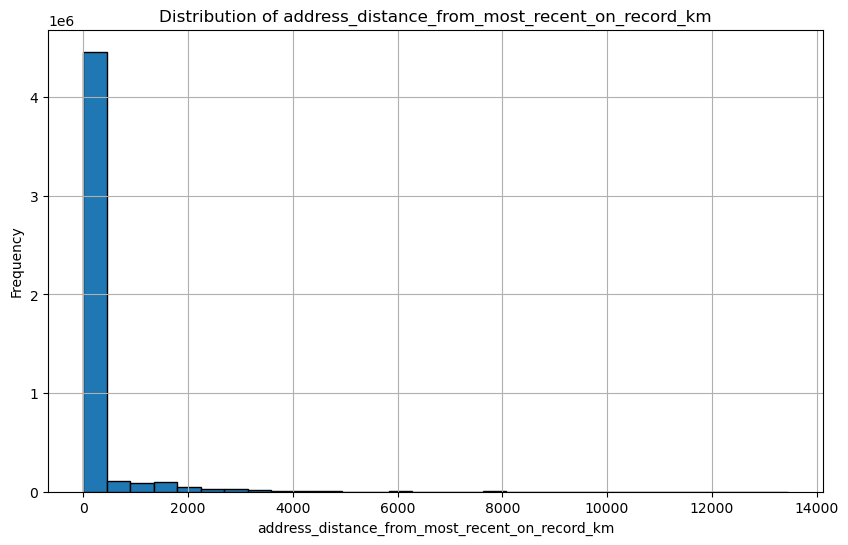

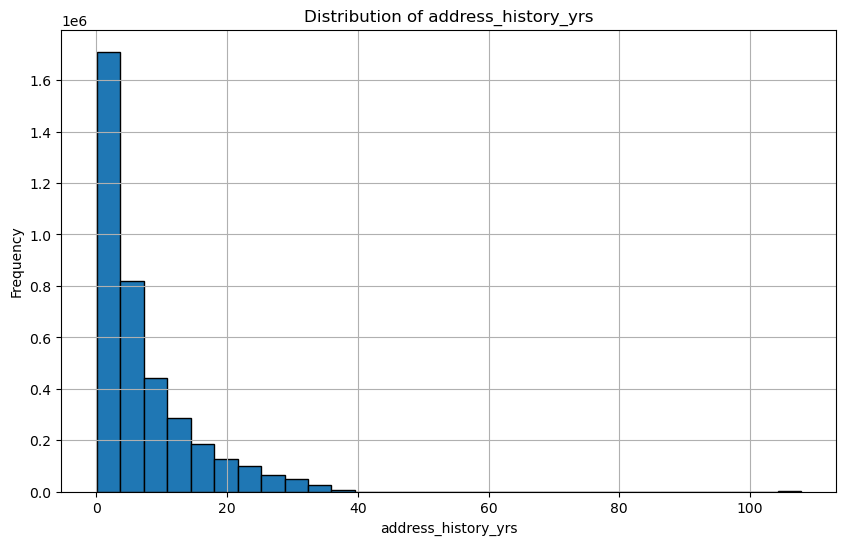

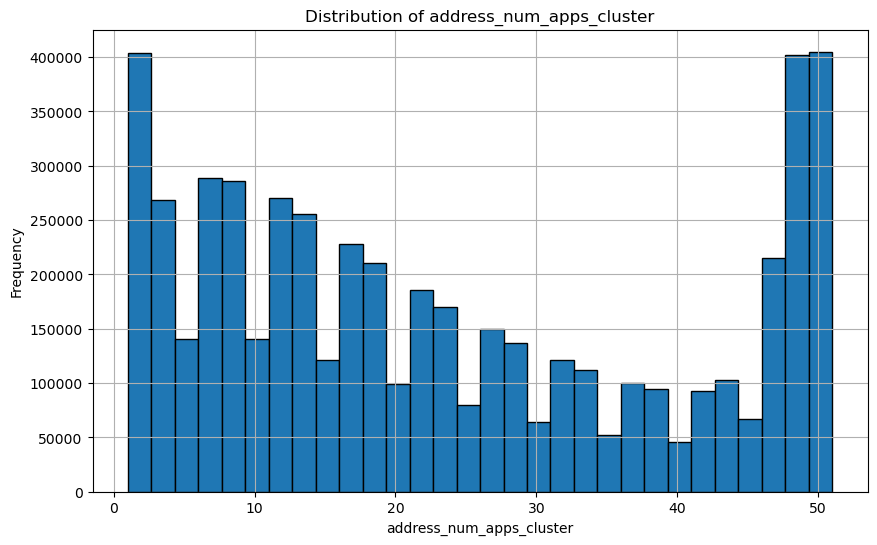

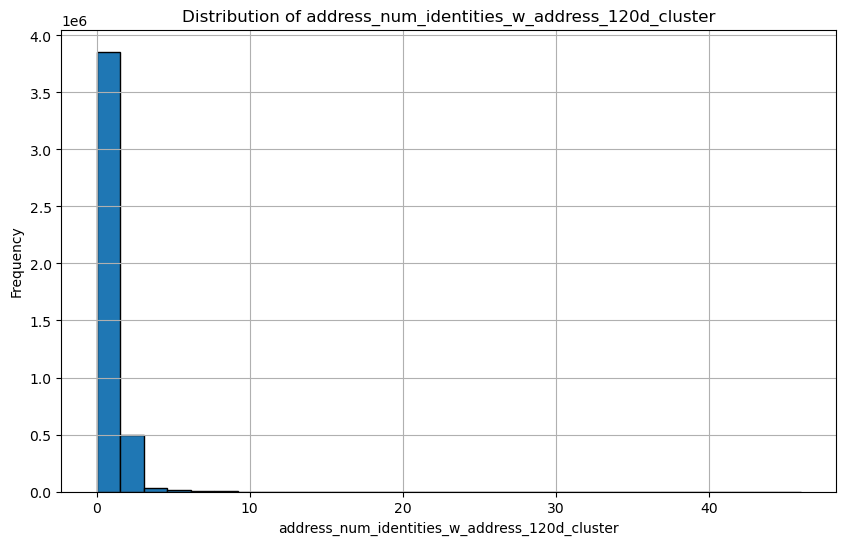

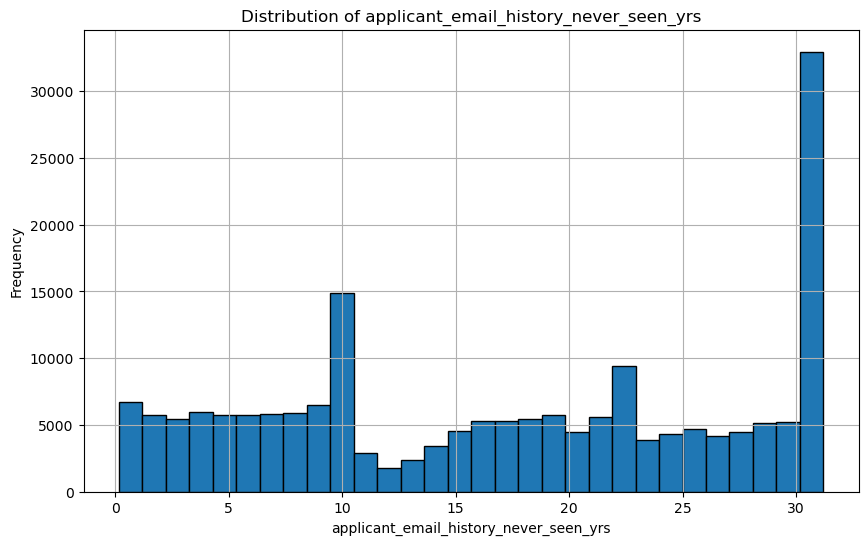

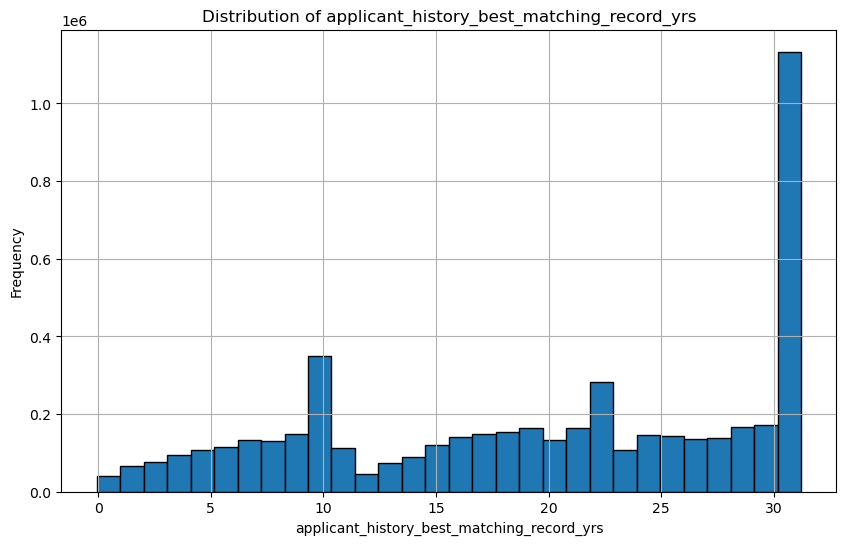

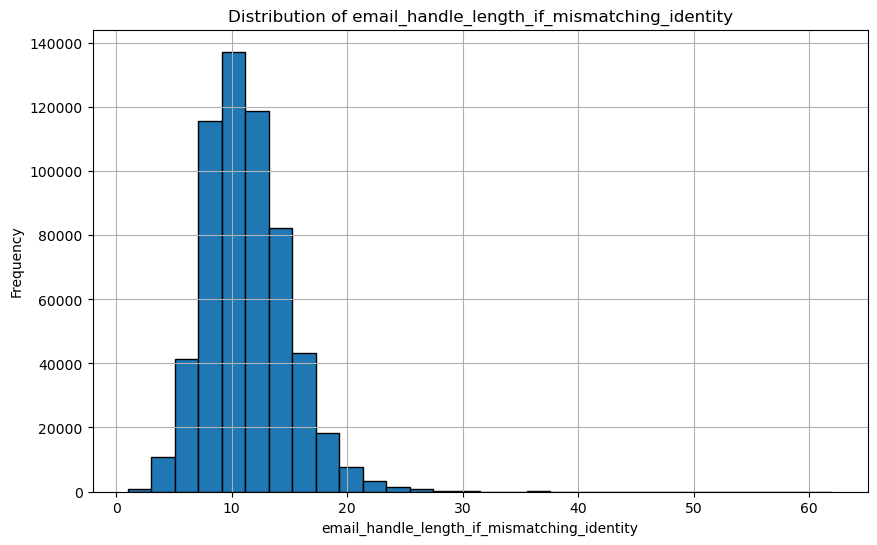

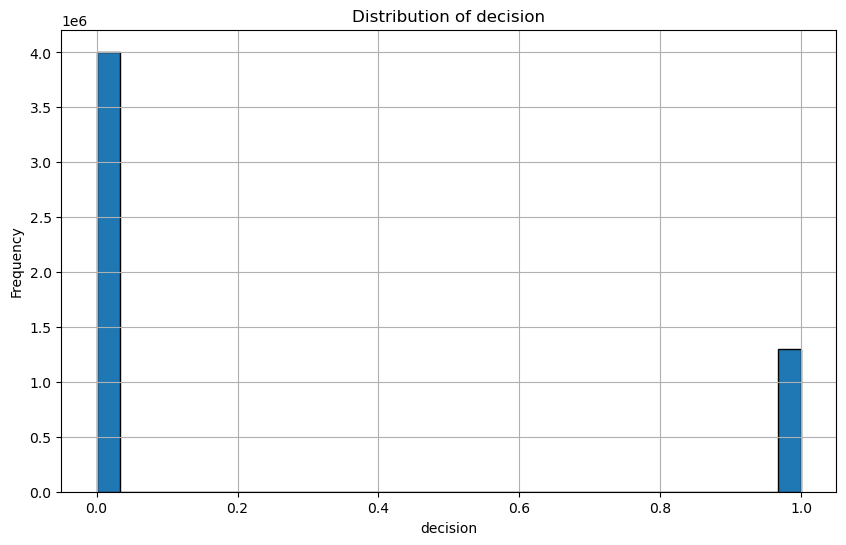

In [36]:
numeric_columns = [
    'address_distance_from_most_recent_on_record_km',
    'address_history_yrs',
    'address_num_apps_cluster',
    'address_num_identities_w_address_120d_cluster',
    'applicant_email_history_never_seen_yrs',
    'applicant_history_best_matching_record_yrs',
    'email_handle_length_if_mismatching_identity',
    'decision'
]

for column in numeric_columns:
    plt.figure(figsize=(10, 6))
    final_df[column].dropna().hist(bins=30, edgecolor='k')
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.show()

## 2.1 Ever_30dpd_in_90 visualization

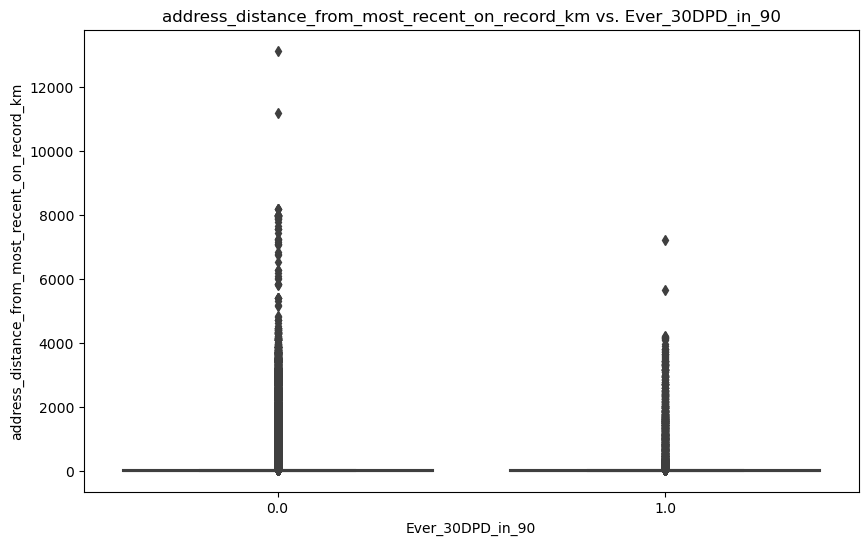

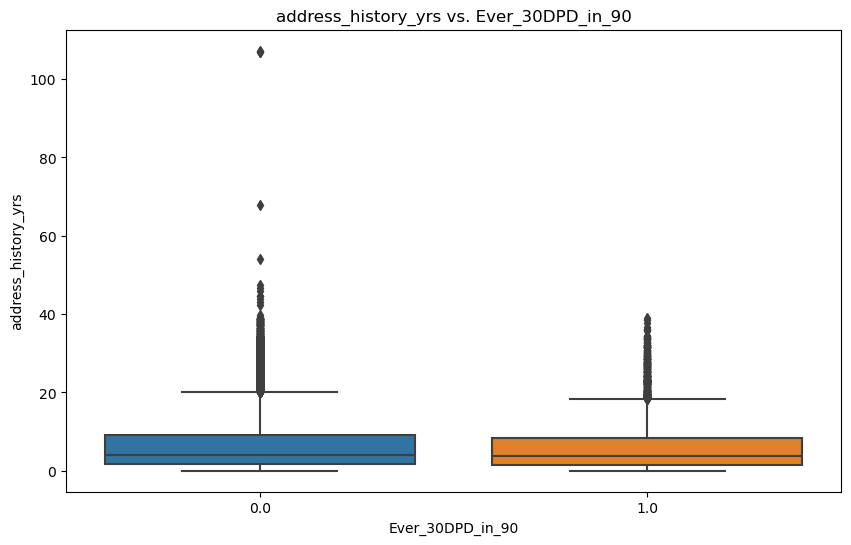

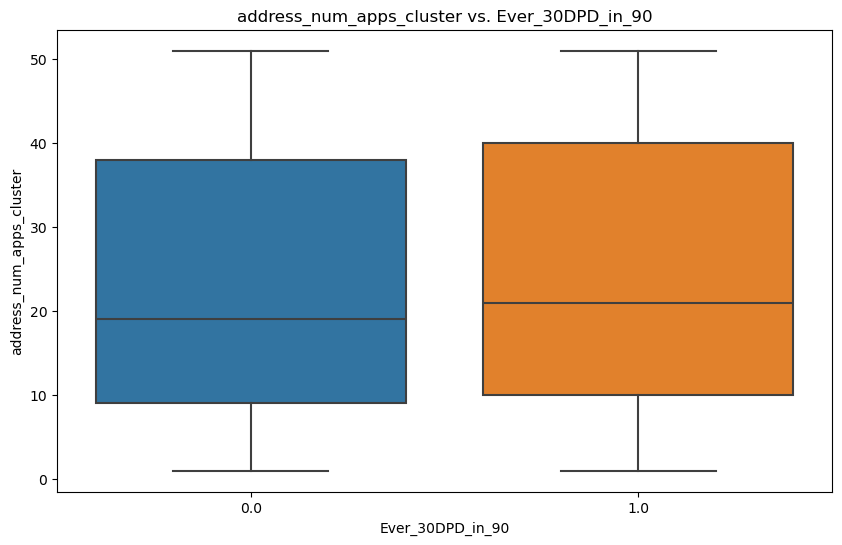

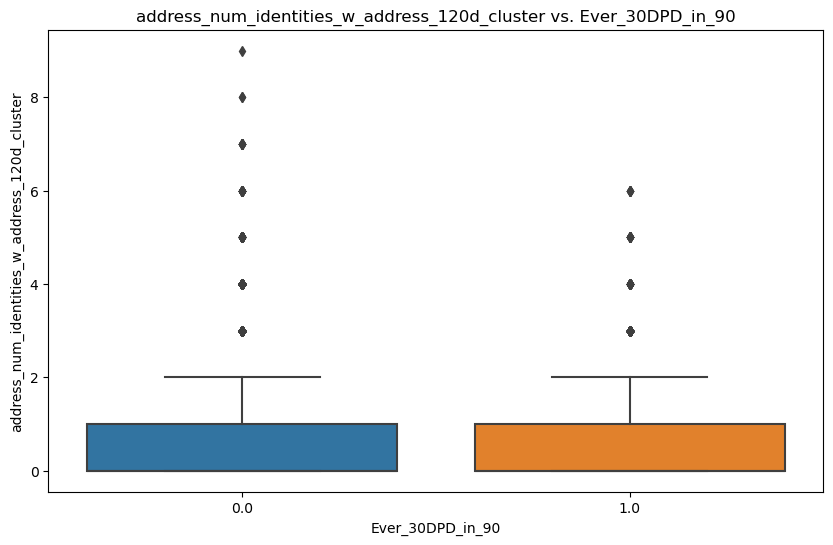

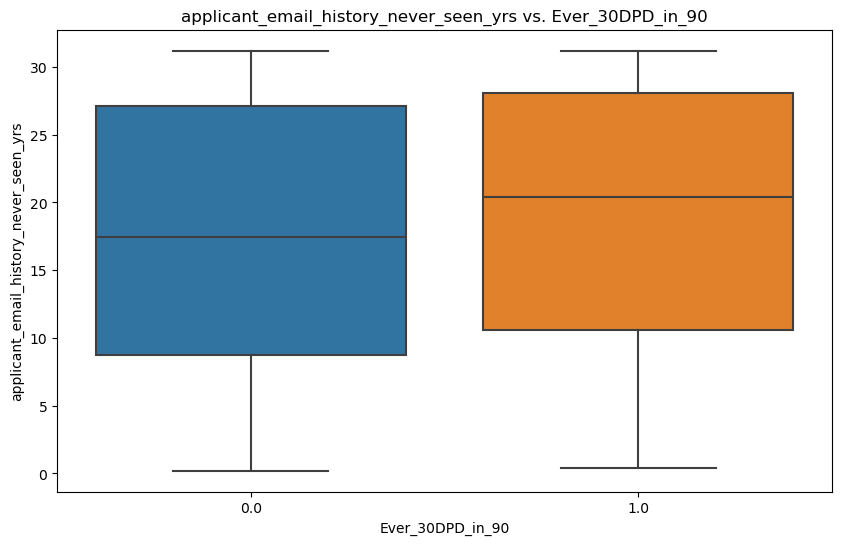

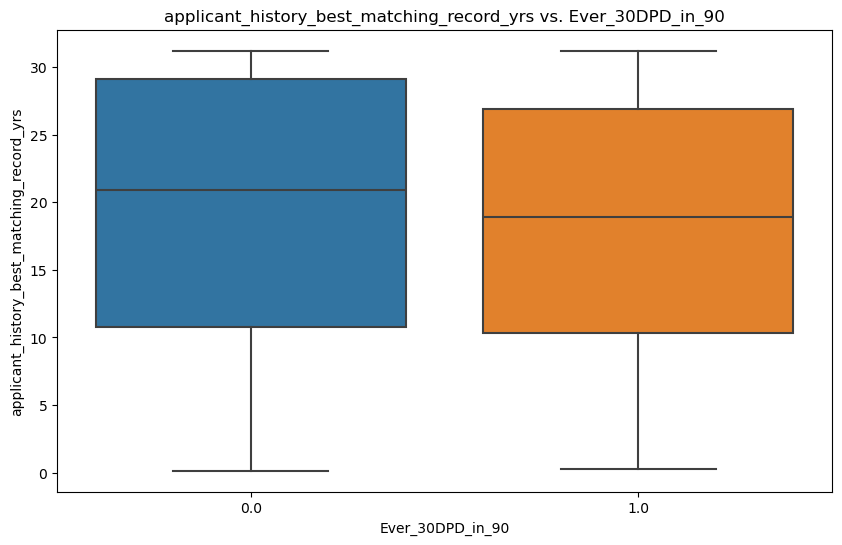

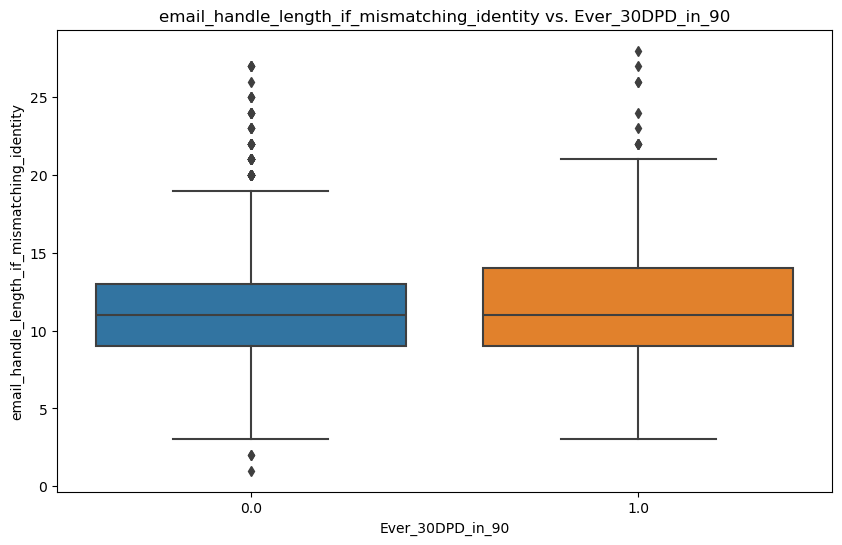

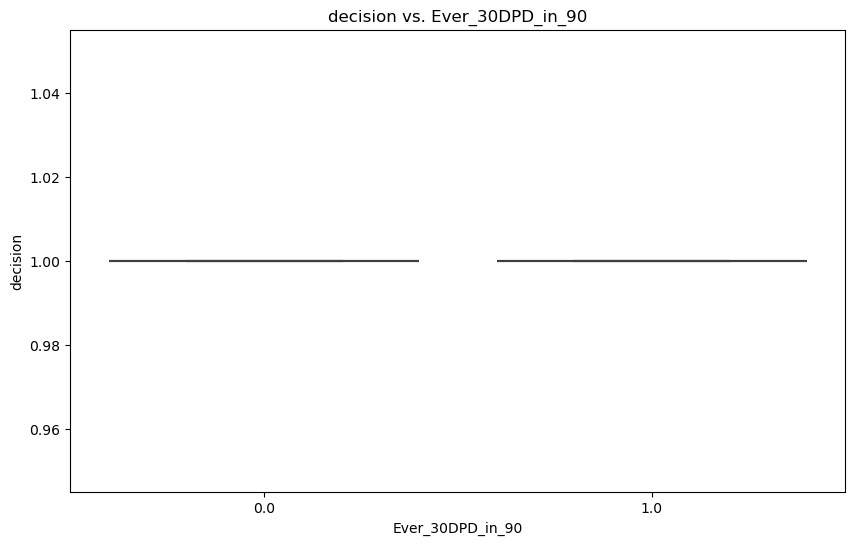

In [37]:
import seaborn as sns

def plot_relationships(data, target, features):
    for feature in features:
        plt.figure(figsize=(10, 6))
        if data[feature].dtype in ['int64', 'float64']:
            sns.boxplot(x=data[target], y=data[feature])
            plt.title(f'{feature} vs. {target}')
            plt.xlabel(target)
            plt.ylabel(feature)
        else: 
            sns.countplot(x=data[feature], hue=data[target])
            plt.title(f'{feature} vs. {target}')
            plt.xlabel(feature)
            plt.ylabel('Count')
        plt.show()

plot_relationships(final_df, 'Ever_30DPD_in_90', numeric_columns)

# 3. Feature Importance

## 3.1 Ever_30DPD_in_90 feature 

In [38]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer

data_clean = final_df.dropna(subset=['Ever_30DPD_in_90'])
numeric_features = data_clean.select_dtypes(include=[np.number]).columns.drop('Ever_30DPD_in_90')
numeric_data = data_clean[numeric_features].dropna(axis=1, how='all')

X = numeric_data
y = data_clean['Ever_30DPD_in_90']
imputer = SimpleImputer(strategy='mean')
X_imputed = imputer.fit_transform(X)
X_imputed_df = pd.DataFrame(X_imputed, columns=X.columns)

In [39]:
correlation_matrix = X_imputed_df.corr(numeric_only=True)
correlation_matrix['Ever_30DPD_in_90'] = data_clean['Ever_30DPD_in_90']
target_correlations = correlation_matrix['Ever_30DPD_in_90'].dropna().sort_values(ascending=False)

X_train, X_test, y_train, y_test = train_test_split(X_imputed, y, test_size=0.3, random_state=42)
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)


RandomForestClassifier(random_state=42)

In [40]:
feature_importances = pd.Series(rf.feature_importances_, index=X.columns).sort_values(ascending=False)
missing_values = final_df.isnull().sum().sort_values(ascending=False)

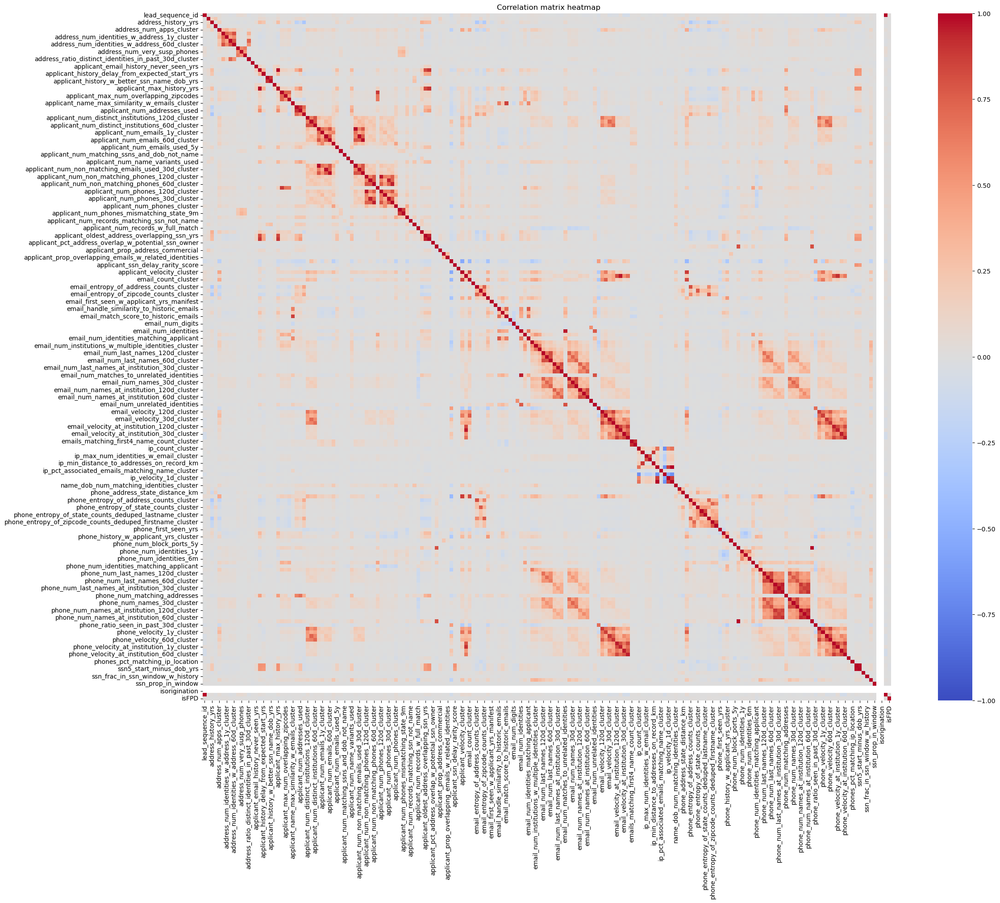

In [41]:
plt.figure(figsize=(25, 20))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation matrix heatmap')
plt.show()

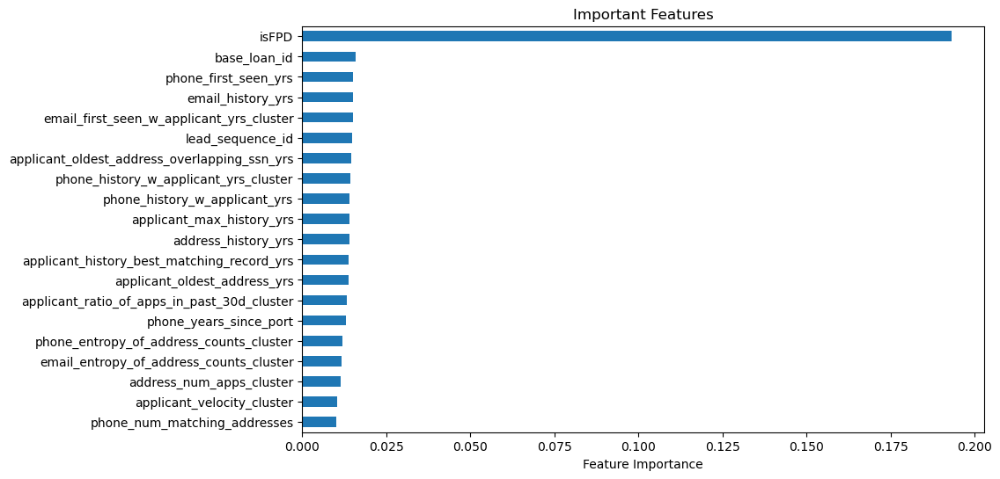

In [42]:
plt.figure(figsize=(10, 6))
feature_importances.head(20).plot(kind='barh')
plt.title('Important Features')
plt.xlabel('Feature Importance')
plt.gca().invert_yaxis()
plt.show()

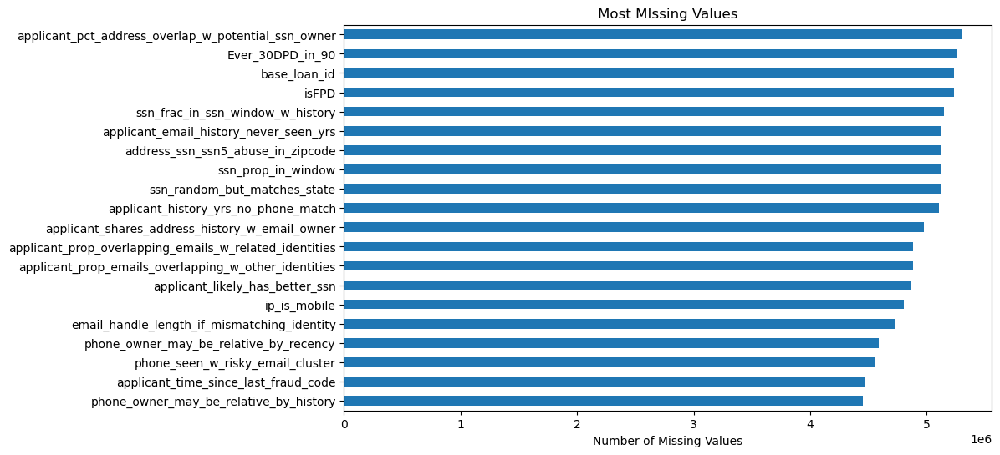

In [43]:
plt.figure(figsize=(10, 6))
missing_values.head(20).plot(kind='barh')
plt.title('Most MIssing Values')
plt.xlabel('Number of Missing Values')
plt.gca().invert_yaxis()
plt.show()
### out of 5310065

In [44]:
top_60_importances = feature_importances.head(60).to_frame(name='Importance')
top_20_missing_values = missing_values.head(20).to_frame(name='Missing Values')

In [45]:
(top_60_importances, top_20_missing_values)

(                                                  Importance
 isFPD                                               0.193260
 base_loan_id                                        0.015981
 phone_first_seen_yrs                                0.015243
 email_history_yrs                                   0.015242
 email_first_seen_w_applicant_yrs_cluster            0.015072
 lead_sequence_id                                    0.014755
 applicant_oldest_address_overlapping_ssn_yrs        0.014549
 phone_history_w_applicant_yrs_cluster               0.014428
 phone_history_w_applicant_yrs                       0.014196
 applicant_max_history_yrs                           0.014115
 address_history_yrs                                 0.014000
 applicant_history_best_matching_record_yrs          0.013927
 applicant_oldest_address_yrs                        0.013871
 applicant_ratio_of_apps_in_past_30d_cluster         0.013188
 phone_years_since_port                              0.013022
 phone_e

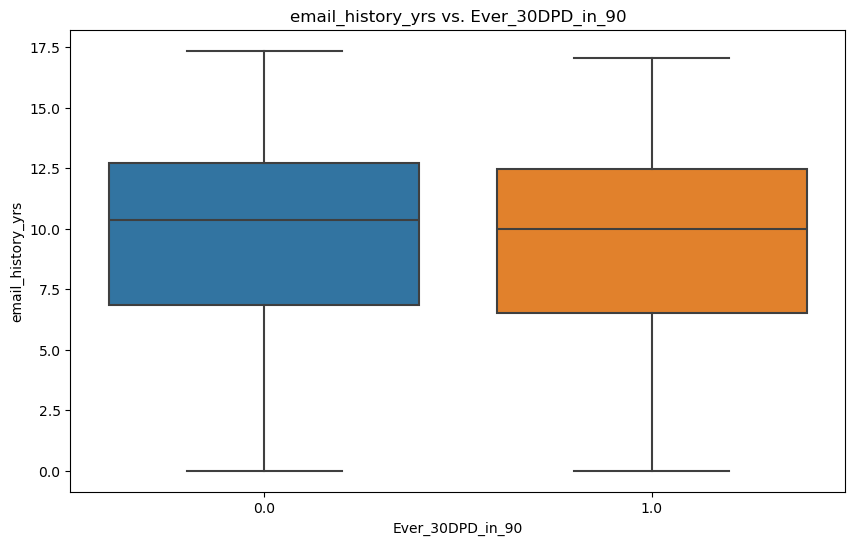

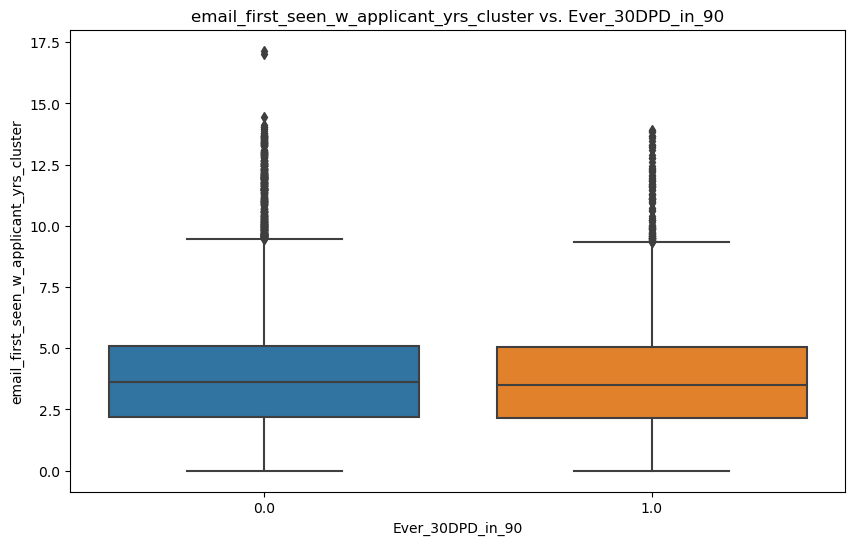

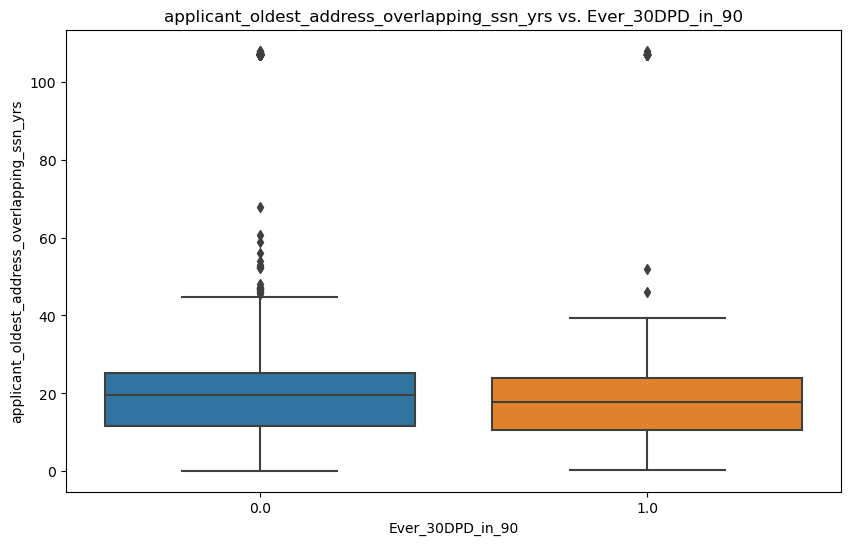

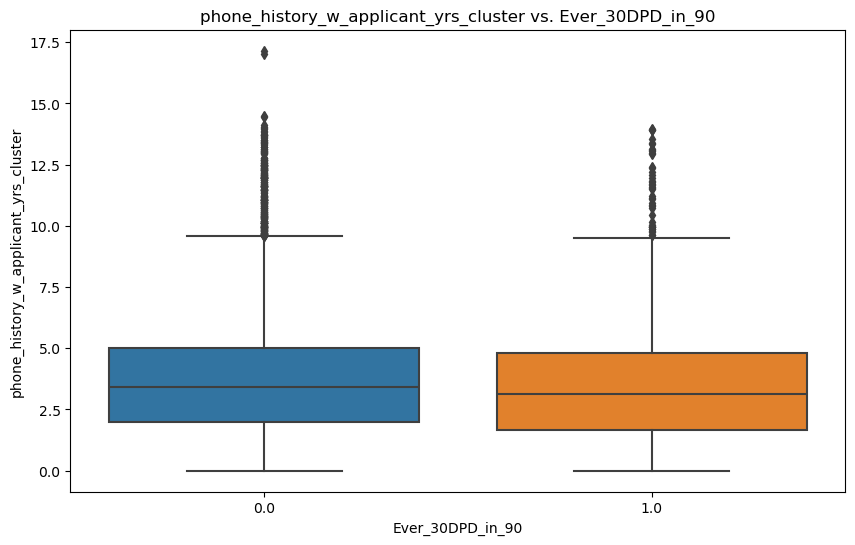

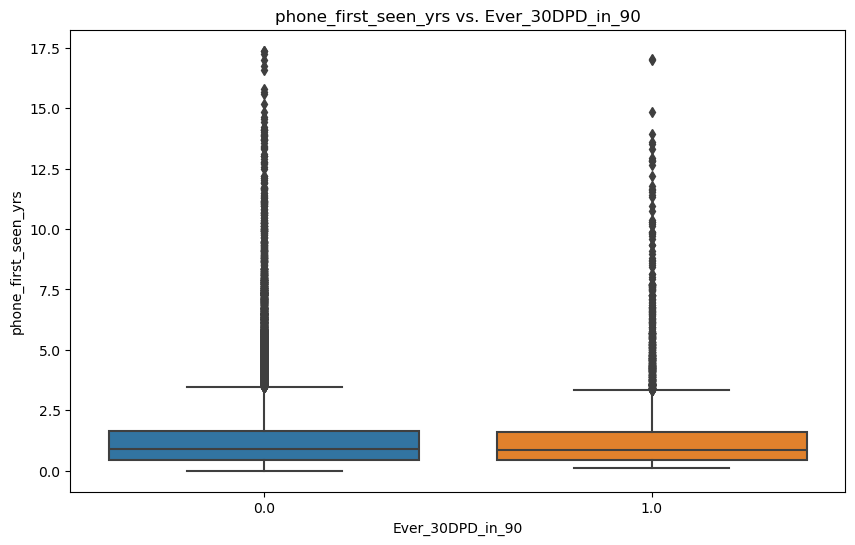

...

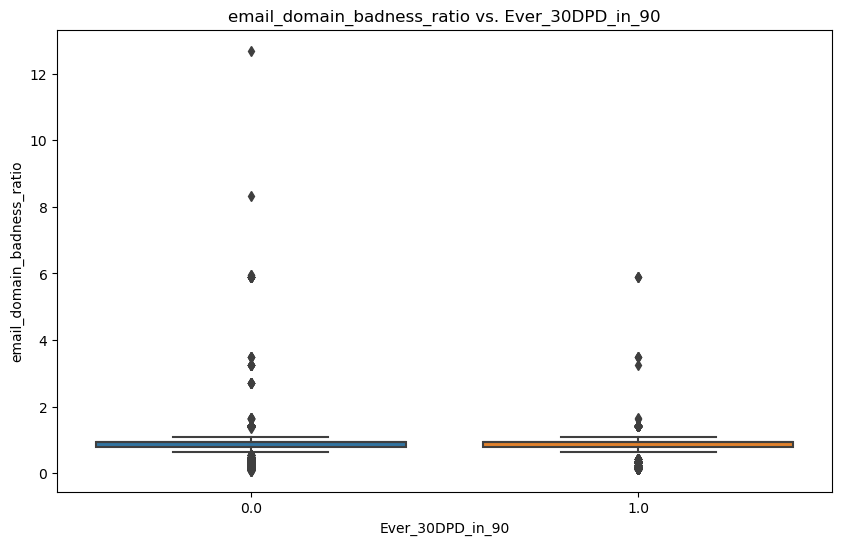

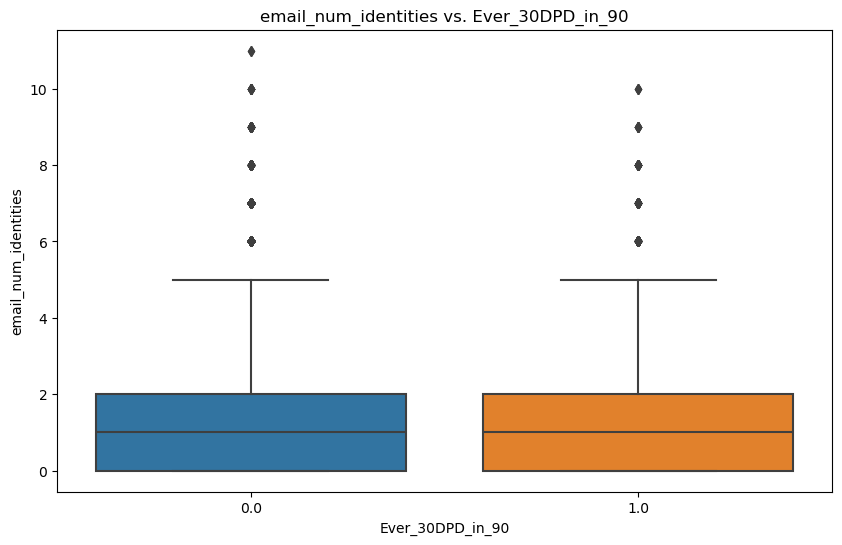

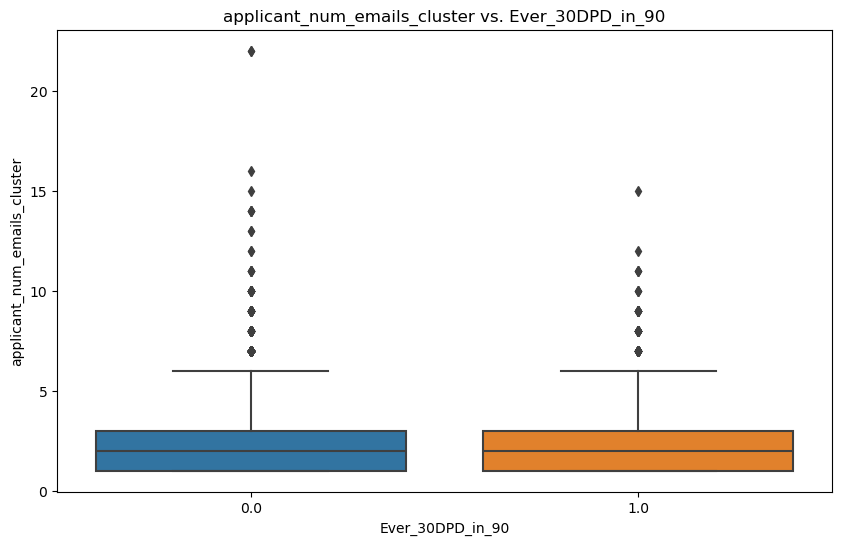

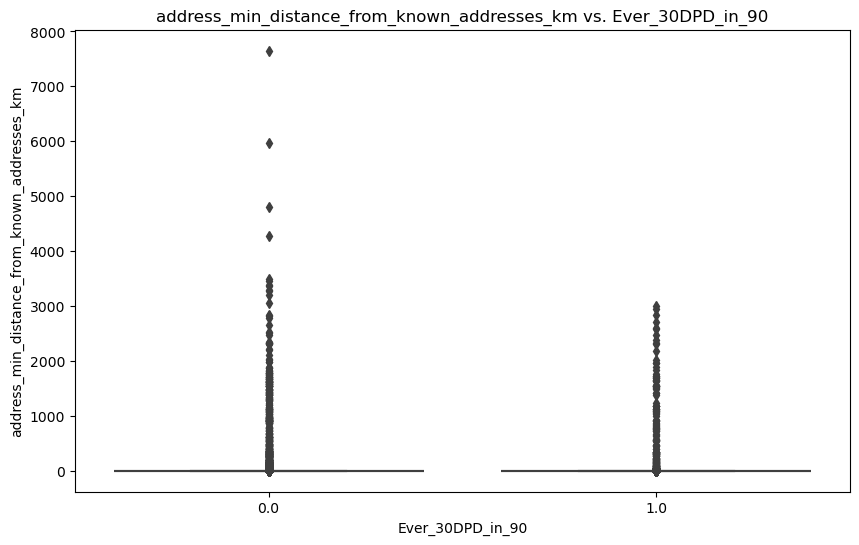

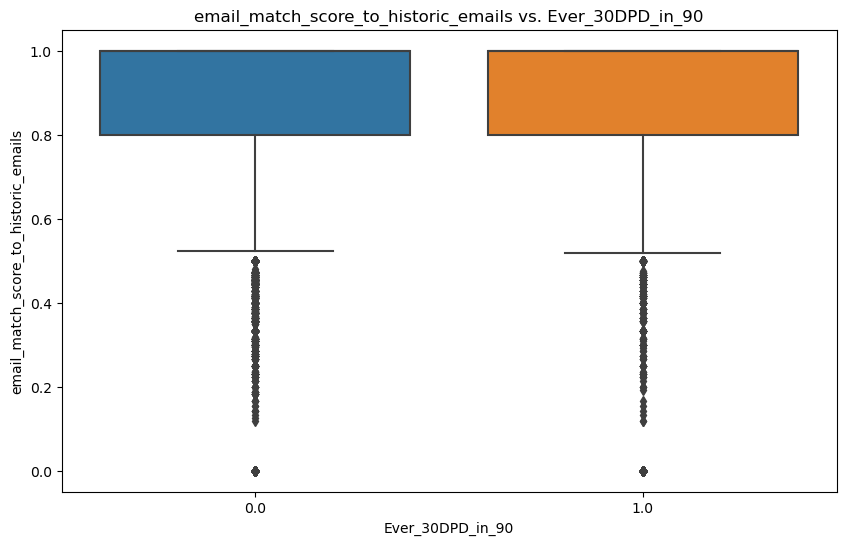

In [46]:

important_columns = [
 'email_history_yrs'                                   ,  
 'email_first_seen_w_applicant_yrs_cluster'            ,
 'applicant_oldest_address_overlapping_ssn_yrs'        ,
 'phone_history_w_applicant_yrs_cluster'               ,
 'phone_first_seen_yrs'                                ,
 'phone_history_w_applicant_yrs'                       ,
 'address_history_yrs'                                 ,
 'applicant_oldest_address_yrs'                        ,
 'applicant_max_history_yrs'                           ,
 'applicant_history_best_matching_record_yrs'          ,
 'applicant_ratio_of_apps_in_past_30d_cluster'         ,
 'phone_years_since_port'                              ,
 'email_entropy_of_address_counts_cluster'             ,
 'address_num_apps_cluster'                            ,
 'phone_entropy_of_address_counts_cluster'             ,
 'applicant_velocity_cluster'                          ,
 'phone_num_matching_addresses'                        ,
 'phone_count_cluster'                                 ,
 'applicant_history_delay_from_expected_start_yrs'     ,
 'email_count_cluster'                                 ,
 'applicant_num_addresses_overlapping_ssn'             ,
 'email_entropy_of_zipcode_counts_cluster'             ,
 'applicant_num_addresses_used'                        ,
 'applicant_ssn_delay_rarity_score'                    ,
 'phone_entropy_of_zipcode_counts_cluster'             ,
 'email_first_seen_w_applicant_yrs_manifest'           ,
 'applicant_num_emails_used_5y'                        ,
 'ssn5_end_minus_dob_yrs'                              ,
 'address_distance_from_most_recent_on_record_km'      ,
 'phone_velocity_1y_cluster'                           ,
 'email_velocity_1y_cluster'                           ,
 'applicant_num_addresses_used_5y'                     ,
 'ssn5_start_minus_dob_yrs'                            ,
 'applicant_num_records_w_partial_match'               ,
 'ssn_address_state_mismatch_score'                    ,
 'applicant_num_phones_used_5y'                        ,
 'ip_min_distance_to_addresses_on_record_km'           ,
 'ip_distance_from_address_km'                         ,
 'phone_num_identities'                                ,
 'phone_num_unrelated_identities'                      ,
 'email_num_digits'                                    ,
 'email_ratio_seen_in_past_30d_cluster'                ,
 'address_num_identities_w_address_1y_cluster'         ,
 'applicant_num_phones_cluster'                        ,
 'phone_velocity_120d_cluster'                         ,
 'email_handle_similarity_to_historic_emails'          ,
 'applicant_time_since_last_fraud_code'                ,
 'applicant_prop_address_commercial'                   ,
 'applicant_num_name_variants_used'                    ,
 'applicant_num_distinct_institutions_120d_cluster'    ,
 'phone_ratio_seen_in_past_30d_cluster'                ,
 'email_velocity_120d_cluster'                         ,
 'email_domain_badness_ratio'                          ,
 'email_num_identities'                                ,
 'applicant_num_emails_cluster'                        ,
 'address_min_distance_from_known_addresses_km'        ,
 'email_match_score_to_historic_emails'                
]

plot_relationships(final_df, 'Ever_30DPD_in_90', important_columns)

In [47]:
dpd_features = ['email_history_yrs',
                'email_first_seen_w_applicant_yrs_cluster',
                'applicant_oldest_address_overlapping_ssn_yrs',
                'phone_history_w_applicant_yrs_cluster',
                'phone_history_w_applicant_yrs',
                'address_history_yrs',
                'applicant_oldest_address_yrs',
                'applicant_max_history_yrs',
                'applicant_history_best_matching_record_yrs',
                'phone_years_since_port',
                'email_entropy_of_address_counts_cluster',
                'phone_entropy_of_address_counts_cluster',
                'applicant_history_delay_from_expected_start_yrs',
                'email_entropy_of_zipcode_counts_cluster',
                'phone_entropy_of_zipcode_counts_cluster',
                'ssn5_end_minus_dob_yrs',
                'applicant_num_addresses_used_5y',
                'ssn5_start_minus_dob_yrs',
                'applicant_num_phones_used_5y',
                'address_num_identities_w_address_1y_cluster',
                'applicant_num_phones_cluster',
                'applicant_time_since_last_fraud_code',
                'applicant_num_distinct_institutions_120d_cluster',
                'applicant_num_emails_cluster',
                'address_min_distance_from_known_addresses_km'
               ]

In [ ]:
def create_unique_bins(feature_data, target_data, initial_bins=10):
    bins = initial_bins
    while bins > 1:
        bin_edges = np.histogram_bin_edges(feature_data.dropna(), bins=bins)
        if len(bin_edges) == len(set(bin_edges)):
            break
        bins -= 1
    bin_labels = pd.cut(feature_data, bins=bin_edges, include_lowest=True, labels=range(len(bin_edges)-1))
    bin_means = target_data.groupby(bin_labels).mean()
    return bin_edges, bin_means

def plot_feature_buckets(data, target_col, features):
    for feature in features:
        feature_data = data[feature]
        target_data = data[target_col]
        bin_edges, bin_means = create_unique_bins(feature_data, target_data)
        plt.figure(figsize=(10, 6))
        plt.bar(range(len(bin_means)), bin_means, tick_label=[f'{bin_edges[i]:.2f}-{bin_edges[i+1]:.2f}' for i in
                                                             range(len(bin_edges)-1)])
        plt.xlabel(f'{feature} Bins')
        plt.ylabel(f'Mean {target_col}')
        plt.title(f'{feature} vs. Mean {target_col}')
        plt.xticks(rotation=45)
        plt.show()

In [ ]:
def decile_buckets(df, icolumns, fpd_column, dpd_column):
    for column in icolumns:
        df['decile'] = pd.qcut(df[column].rank(method='first'), 10, labels=False) + 1
        stats = df.groupby(['decile', fpd_column])[column].agg(['count']).reset_index()
        stats_pivot = stats.pivot(index='decile', columns=fpd_column, values=['count']).reset_index()
        stats_pivot.columns = ['decile', 'count_0', 'count_1']
        stats_pivot.fillna({'count_0': 0, 'count_1': 0}, inplace=True)
        stats_pivot['total'] = stats_pivot['count_0'] + stats_pivot['count_1']
        stats_pivot['default_rate'] = stats_pivot['count_1'] / stats_pivot['total'] * 100
        stats_interval = df.groupby('decile')[column].agg(['min', 'max']).reset_index()
        result = pd.merge(stats_interval, stats_pivot,  on='decile')
        dpd_stats = df.groupby('decile')[dpd_column].mean().reset_index()
        result = pd.merge(result, dpd_stats, on='decile')
        print(f'{column}')
        print(result)


In [ ]:
feature_buckets = decile_buckets(final_df, dpd_features, 'isFPD', 'Ever_30DPD_in_90')

In [48]:
def decile_buckets(df, icolumns, fpd_column, dpd_column):
    feature_buckets = {}
    for col in icolumns:
        df['decile'] = pd.qcut(df[col].rank(method='first'), 10, labels=False) + 1
        decile_df = df.groupby('decile').agg(
            min_value=(col, 'min'),
            max_value=(col, 'max'),
            default_rate=(fpd_column, 'mean'),
            ever_30dpd=(dpd_column, 'mean')
        ).reset_index()
        decile_df['feature'] = col
        feature_buckets[col] = decile_df
    return feature_buckets

feature_buckets = decile_buckets(final_df, dpd_features, 'isFPD', 'Ever_30DPD_in_90')
print(feature_buckets)


{'email_history_yrs':    decile  min_value  max_value  default_rate  ever_30dpd            feature
0     1.0   0.000000   2.015058      0.103088    0.169387  email_history_yrs
1     2.0   2.015058   3.868583      0.092240    0.139625  email_history_yrs
2     3.0   3.868583   5.508556      0.091711    0.148770  email_history_yrs
3     4.0   5.508556   6.956879      0.088687    0.134704  email_history_yrs
4     5.0   6.956879   8.232717      0.091287    0.141894  email_history_yrs
5     6.0   8.232717  10.036961      0.087271    0.145012  email_history_yrs
6     7.0  10.036961  11.060917      0.075461    0.128338  email_history_yrs
7     8.0  11.060917  12.531143      0.083383    0.139187  email_history_yrs
8     9.0  12.531143  14.206708      0.078564    0.128093  email_history_yrs
9    10.0  14.206708  17.538672      0.073407    0.112360  email_history_yrs, 'email_first_seen_w_applicant_yrs_cluster':    decile  min_value    max_value  default_rate  ever_30dpd  \
0     1.0   0.000000   

In [127]:
import openpyxl
from openpyxl.drawing.image import Image 
import os

def write_to_excel_with_graphs(feature_buckets, output_file):
    with pd.ExcelWriter(output_file, engine='openpyxl') as writer:
        sheet_index = 0
        
        for feature, df in feature_buckets.items():
            sheet_name = f'Features {sheet_index // 5 + 1}'
            startrow = (sheet_index % 5) * 15
            df.to_excel(writer, sheet_name=sheet_name, index=False, startrow=startrow)
            
            plt.figure(figsize=(8, 6))
            plt.bar(df['decile'], df['ever_30dpd'])
            plt.xlabel('Decile')
            plt.ylabel('Ever_30dpd_in_90')
            
            image_path = f'{feature}.png'
            plt.savefig(image_path)
            plt.close()
            workbook = writer.book
            worksheet = workbook[sheet_name]
            img = openpyxl.drawing.image.Image(image_path)
            img.anchor = f'I{startrow + 1}'
            worksheet.add_image(img)
            sheet_index += 1
            
    for feature in feature_buckets.keys():
        os.remove(f'{feature}.png')

In [128]:
output_file = 'feature_buckets.xlsx'
write_to_excel_with_graphs(feature_buckets, output_file)

## Graph features that show the best trends relating to dpd/fpd
### Look at isoriginated and do the same as for dpd/fpd
#### Check features against TUrs/mkscore and see if the features within Sentilink offer anything suggestive for defaults

## 3.2 isOrigination 

In [77]:
columns_drop_2 = ['isFPD', 'base_loan_id', 'Ever_30DPD_in_90', 'decision', 'lead_sequence_id']
final_df_iso = final_df.drop(columns=columns_drop_2)

In [141]:
final_df_iso

,address_city_matches_records,address_distance_from_most_recent_on_record_km,address_history_yrs,address_min_distance_from_known_addresses_km,address_num_apps_cluster,address_num_identities_w_address_120d_cluster,address_num_identities_w_address_1y_cluster,address_num_identities_w_address_30d_cluster,address_num_identities_w_address_60d_cluster,address_num_susp_phones,...,ssn_address_state_mismatch_score,ssn_bogus,ssn_frac_in_ssn_window_w_history,ssn_may_belong_to_a_minor,ssn_num_identities_cluster,ssn_prop_in_window,ssn_random_but_matches_state,zipcode_first_3_matches_manifest,zipcode_matches_manifest,isorigination
0,True,26.392402,NaN,4.046947,2.0,0.0,1.0,0.0,0.0,0.0,...,0.000000,False,NaN,False,1.0,NaN,NaN,True,True,0
1,True,1.909185,NaN,1.909185,5.0,NaN,NaN,NaN,NaN,0.0,...,0.000000,False,NaN,False,6.0,NaN,NaN,True,True,0
2,False,2346.063426,NaN,2.054761,36.0,3.0,4.0,0.0,1.0,0.0,...,0.192993,False,NaN,False,1.0,NaN,NaN,False,False,0
3,True,0.000000,6.535250,0.000000,35.0,2.0,2.0,0.0,1.0,0.0,...,1.116071,False,NaN,False,2.0,NaN,NaN,True,True,0
4,True,1498.239721,12.788501,0.000000,34.0,0.0,0.0,0.0,0.0,0.0,...,0.070659,False,NaN,False,2.0,NaN,NaN,True,True,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5310061,True,0.000000,5.492129,0.000000,11.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,False,NaN,False,3.0,NaN,NaN,True,True,0
5310062,True,0.000000,7.824778,0.000000,34.0,0.0,0.0,0.0,0.0,0.0,...,0.118024,False,NaN,False,5.0,NaN,NaN,True,True,0
5310063,True,13.316022,NaN,8.447041,7.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,False,NaN,False,1.0,NaN,NaN,True,False,1
5310064,True,0.000000,0.076660,0.000000,5.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,False,NaN,False,2.0,NaN,NaN,True,True,0


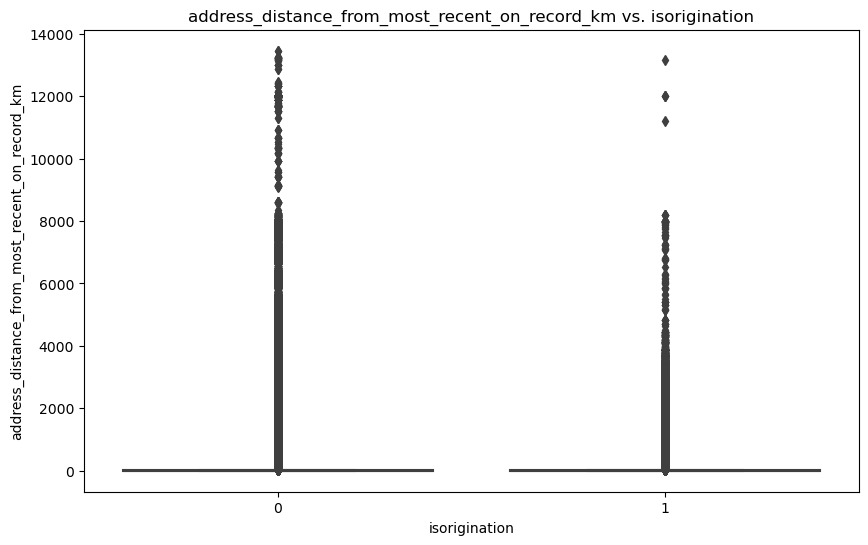

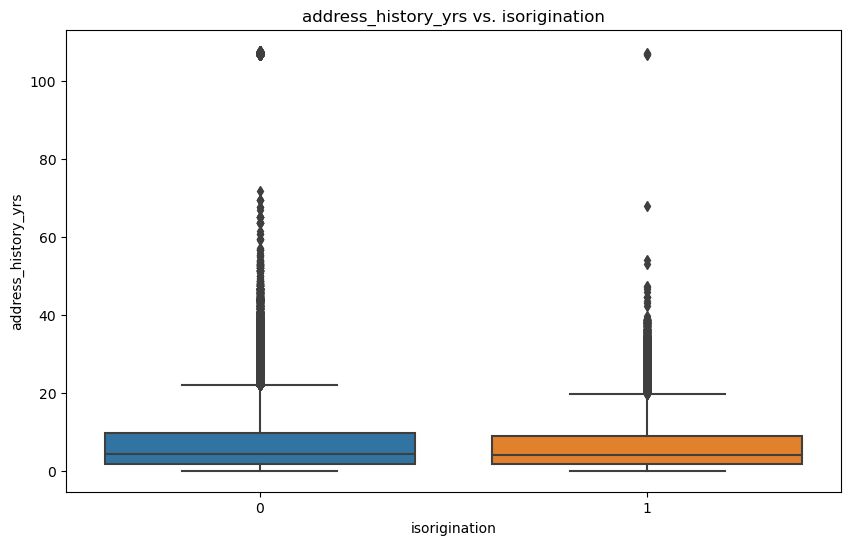

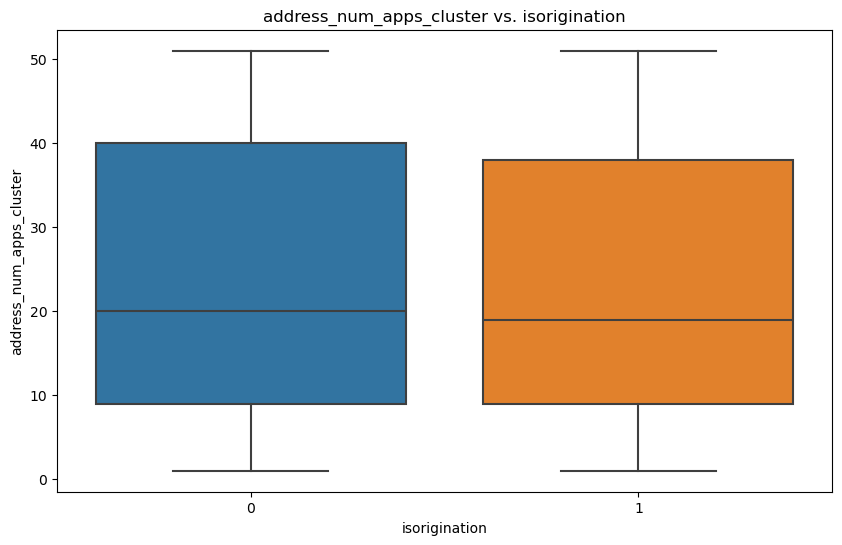

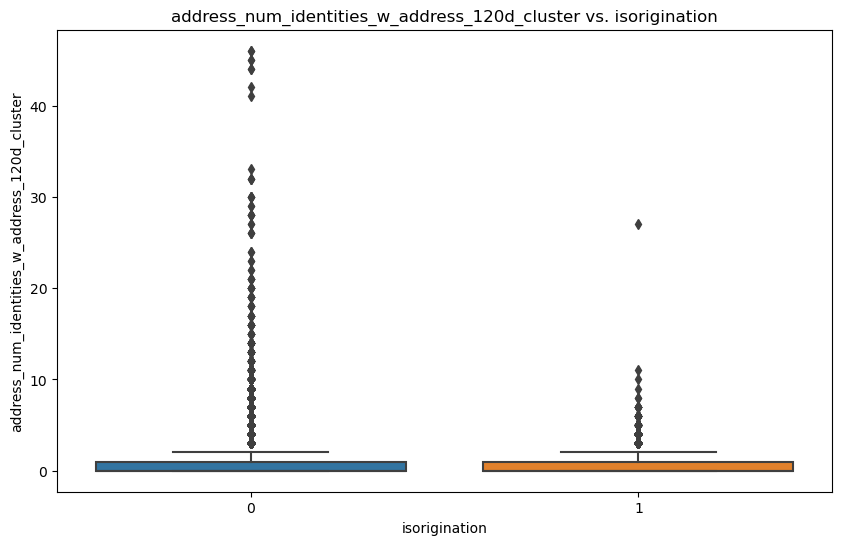

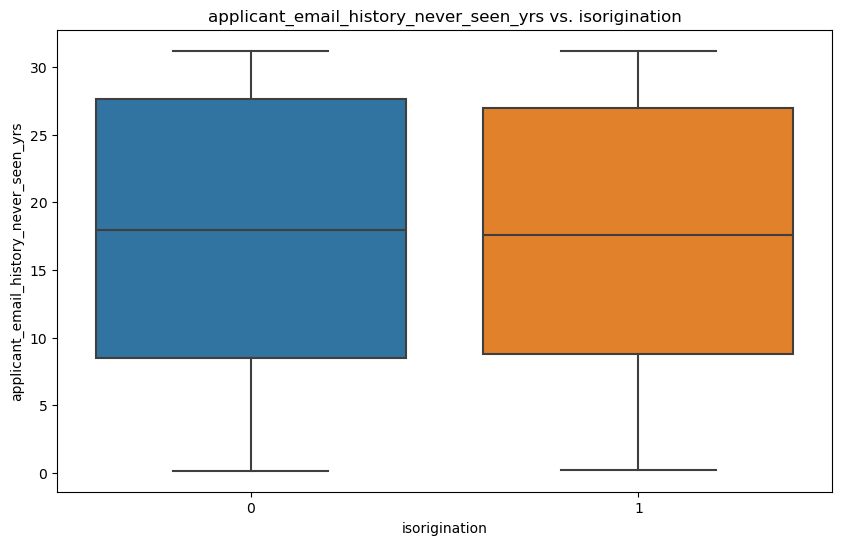

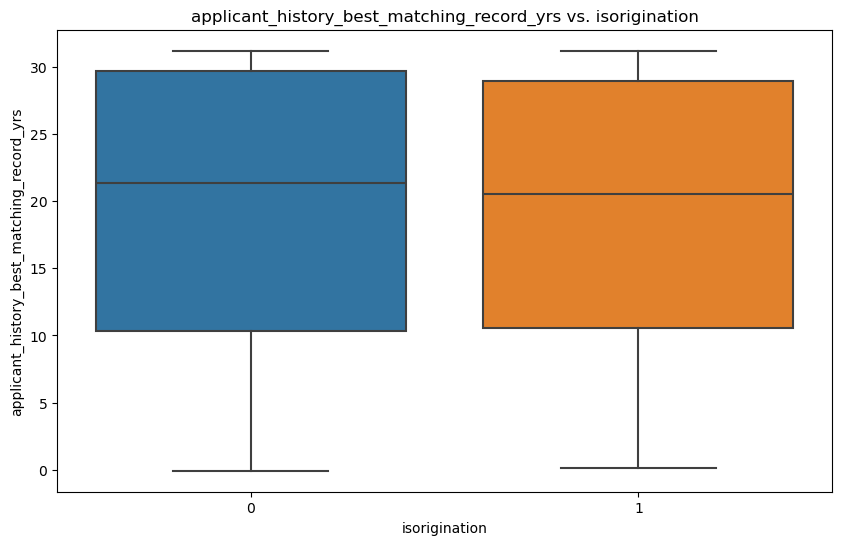

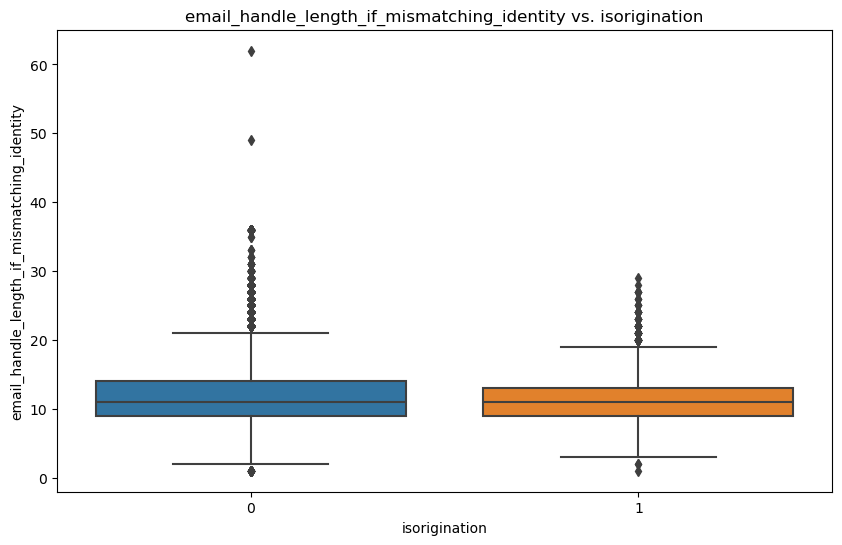

KeyError: 'decision'

<Figure size 1000x600 with 0 Axes>

In [50]:
plot_relationships(final_df_iso, 'isorigination', numeric_columns)

In [51]:
data_clean_iso = final_df_iso.dropna(subset=['isorigination'])
numeric_features = data_clean_iso.select_dtypes(include=[np.number]).columns.drop('isorigination')
numeric_data = data_clean_iso[numeric_features].dropna(axis=1, how='all')

X = numeric_data
y = data_clean_iso['isorigination']
imputer = SimpleImputer(strategy='mean')
X_imputed = imputer.fit_transform(X)
X_imputed_df = pd.DataFrame(X_imputed, columns=X.columns)

In [52]:
correlation_matrix = X_imputed_df.corr(numeric_only=True)
correlation_matrix['isorigination'] = data_clean_iso['isorigination']
target_correlations = correlation_matrix['isorigination'].dropna().sort_values(ascending=False)

X_train, X_test, y_train, y_test = train_test_split(X_imputed, y, test_size=0.3, random_state=42)
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [53]:
feature_importances = pd.Series(rf.feature_importances_, index=X.columns).sort_values(ascending=False)

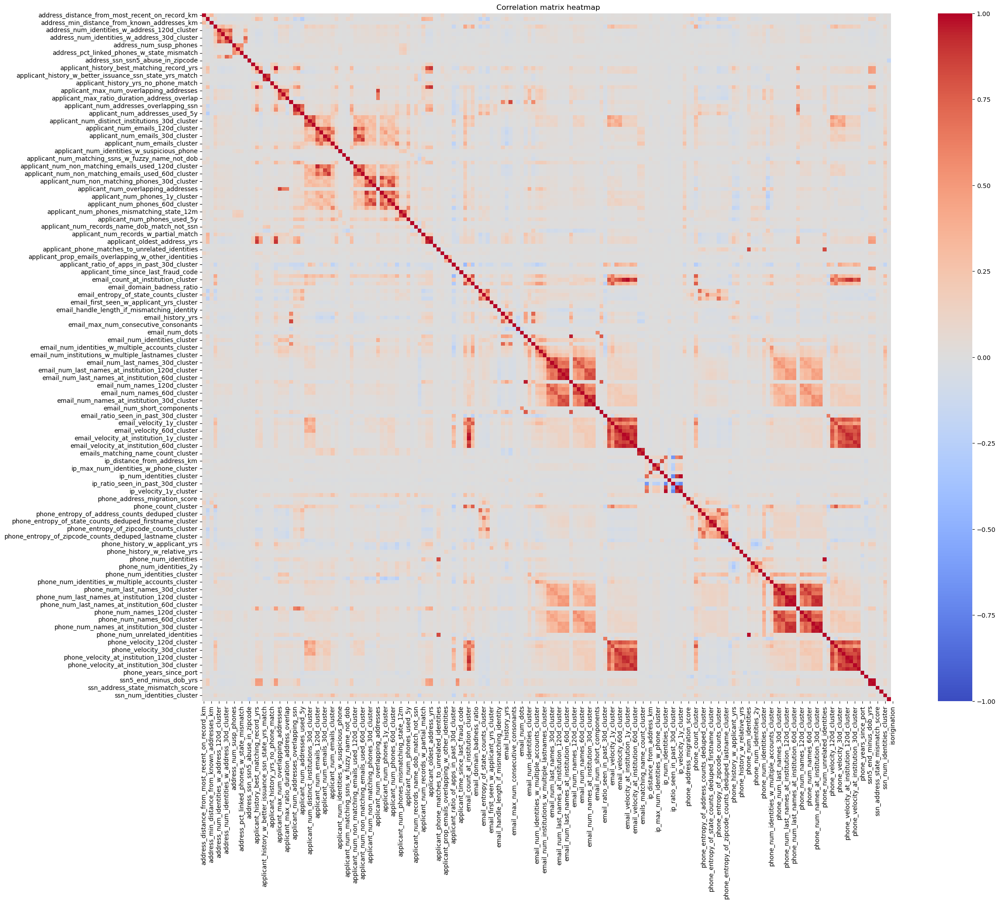

In [54]:
plt.figure(figsize=(25, 20))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation matrix heatmap')
plt.show()

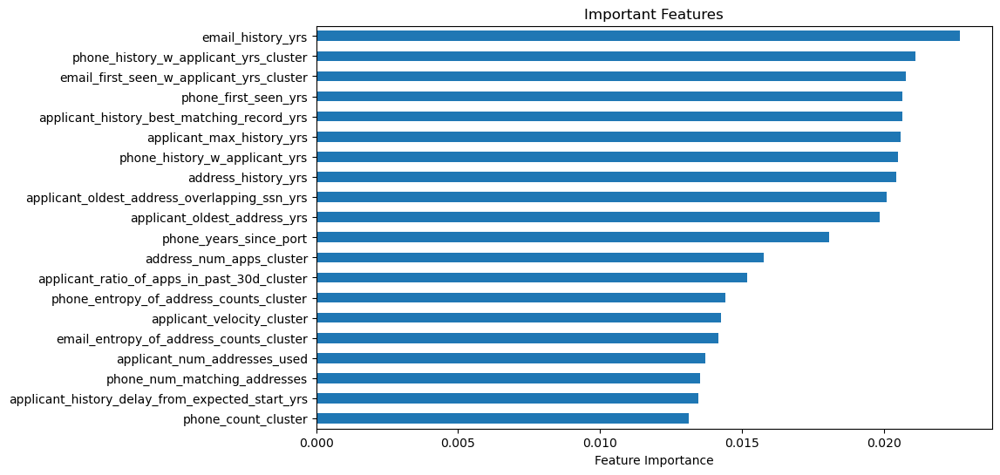

In [55]:
plt.figure(figsize=(10, 6))
feature_importances.head(20).plot(kind='barh')
plt.title('Important Features')
plt.xlabel('Feature Importance')
plt.gca().invert_yaxis()
plt.show()

In [56]:
top_50_importances = feature_importances.head(50).to_frame(name='Importance')
top_50_importances

,Importance
email_history_yrs,0.022680
phone_history_w_applicant_yrs_cluster,0.021126
email_first_seen_w_applicant_yrs_cluster,0.020786
phone_first_seen_yrs,0.020671
applicant_history_best_matching_record_yrs,0.020661
applicant_max_history_yrs,0.020590
phone_history_w_applicant_yrs,0.020496
address_history_yrs,0.020438
applicant_oldest_address_overlapping_ssn_yrs,0.020115
applicant_oldest_address_yrs,0.019860


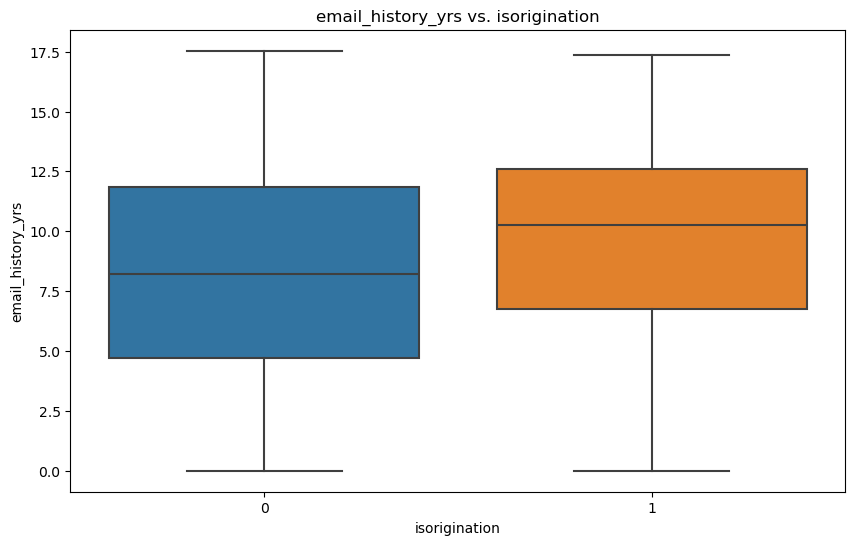

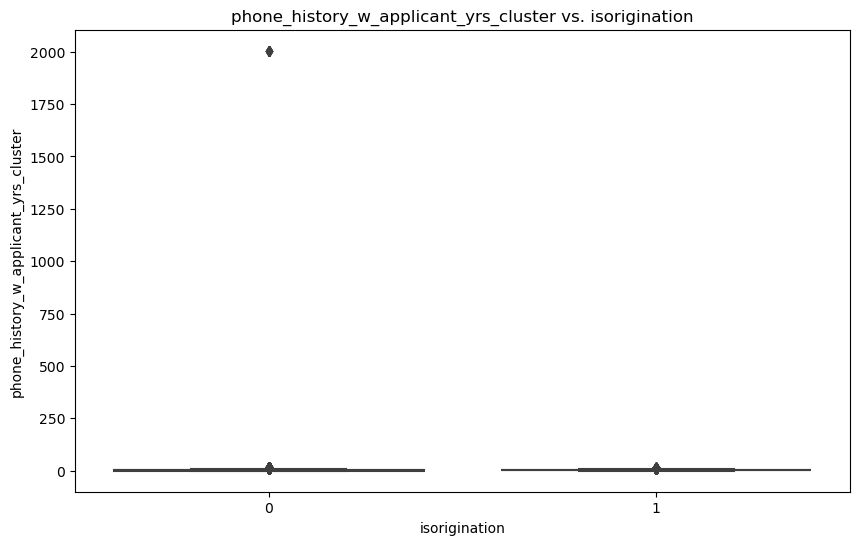

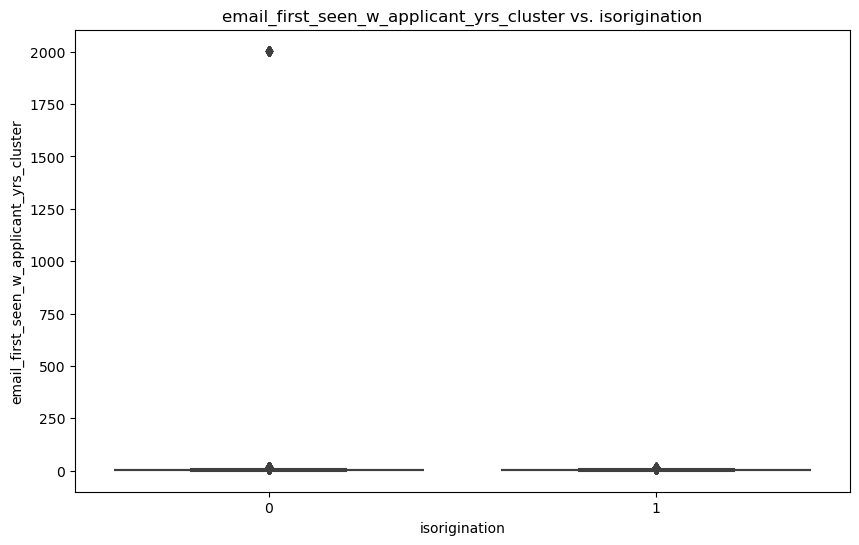

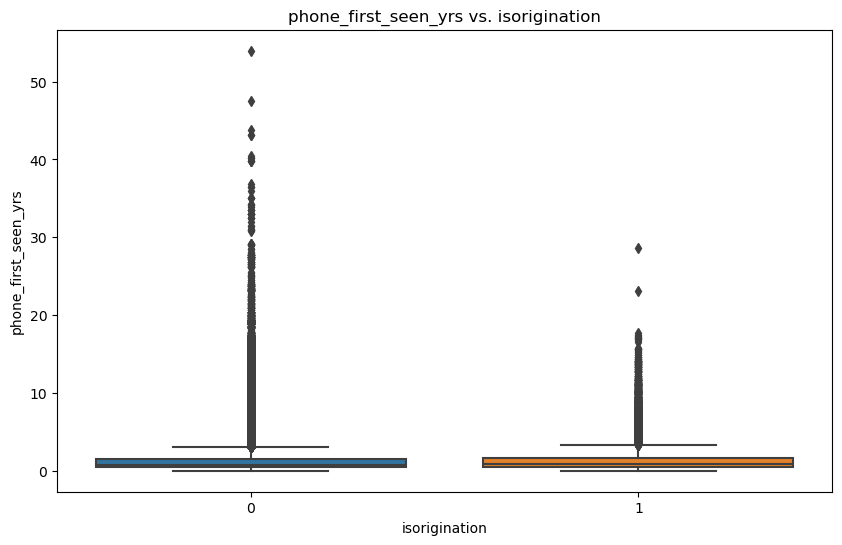

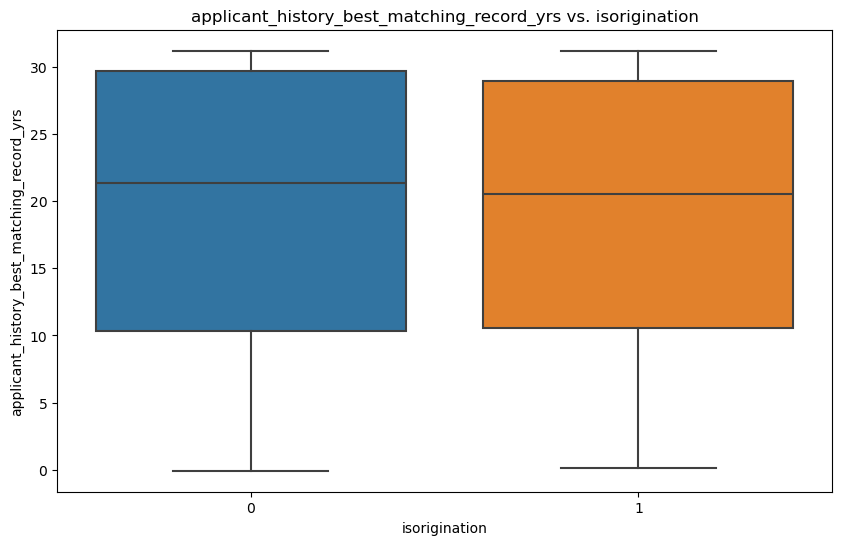

...

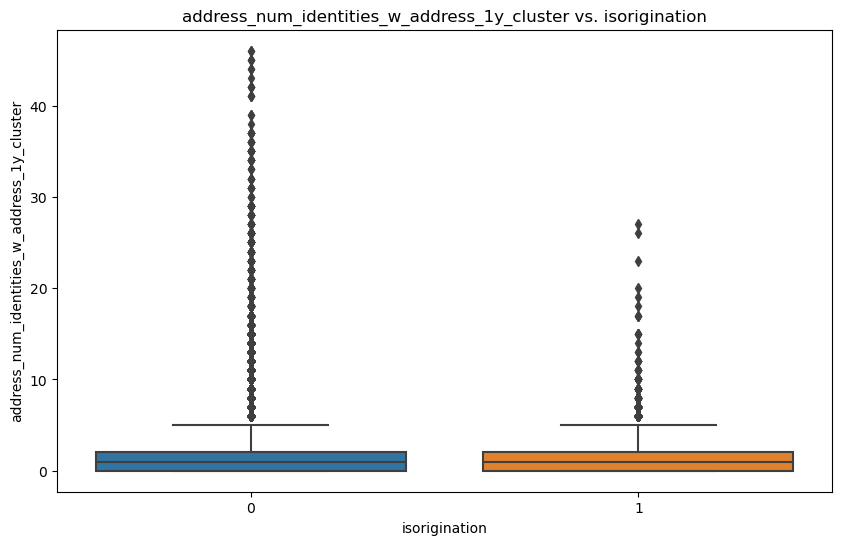

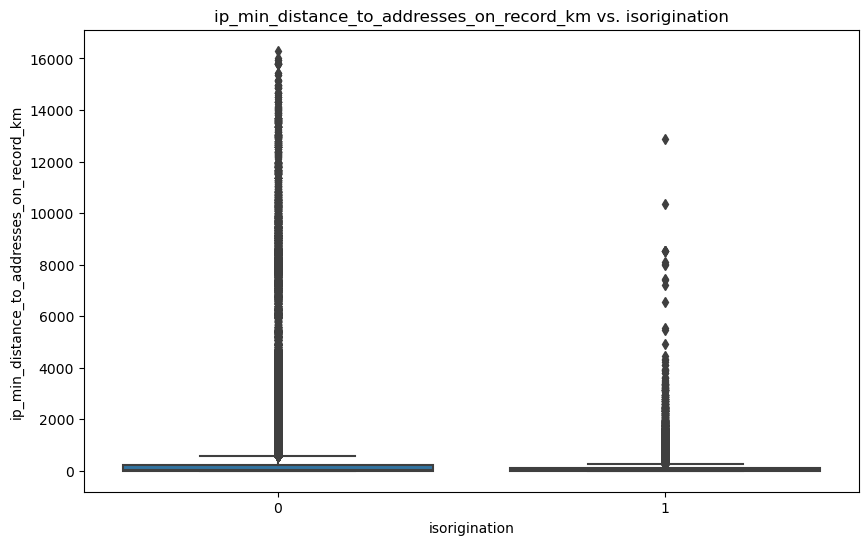

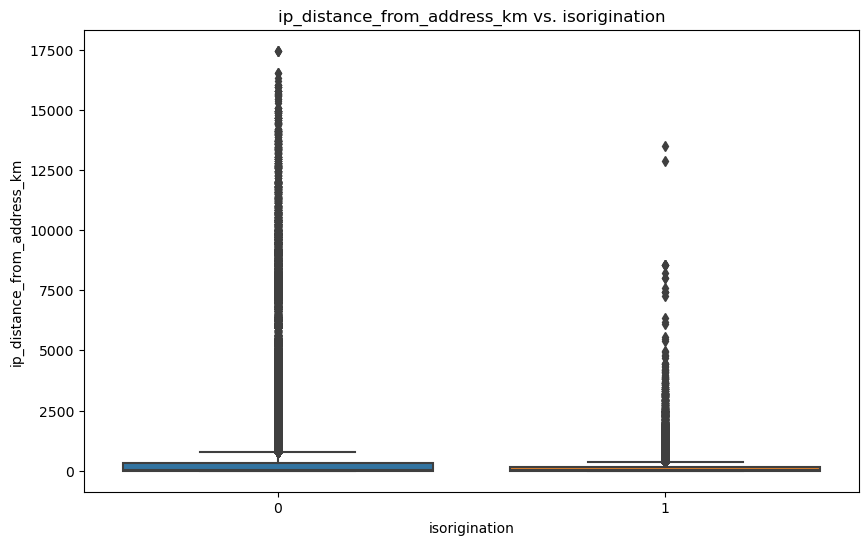

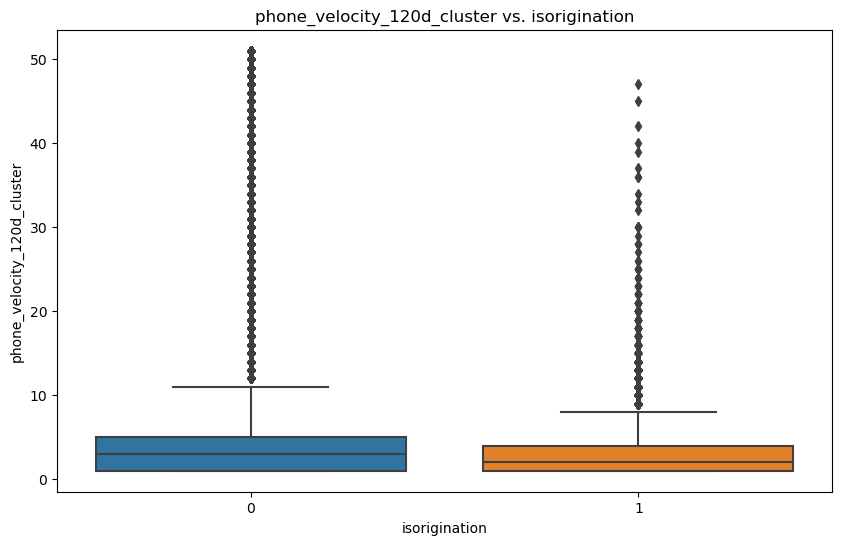

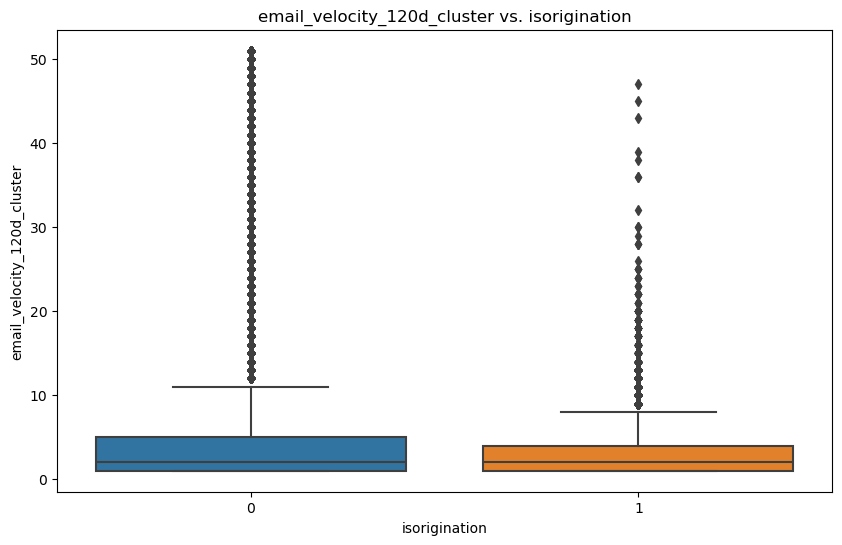

In [57]:
important_columns_iso = [
    'email_history_yrs',
    'phone_history_w_applicant_yrs_cluster',
    'email_first_seen_w_applicant_yrs_cluster',
    'phone_first_seen_yrs',
    'applicant_history_best_matching_record_yrs',
    'applicant_max_history_yrs',
    'phone_history_w_applicant_yrs',
    'address_history_yrs',
    'applicant_oldest_address_overlapping_ssn_yrs',
    'applicant_oldest_address_yrs',
    'phone_years_since_port',
    'address_num_apps_cluster',
    'applicant_ratio_of_apps_in_past_30d_cluster',
    'phone_entropy_of_address_counts_cluster',
    'applicant_velocity_cluster',
    'email_entropy_of_address_counts_cluster',
    'applicant_num_addresses_used',
    'phone_num_matching_addresses',
    'applicant_history_delay_from_expected_start_yrs',
    'phone_count_cluster',
    'email_count_cluster',
    'applicant_num_addresses_overlapping_ssn',
    'applicant_ssn_delay_rarity_score',
    'applicant_num_emails_used_5y',
    'address_distance_from_most_recent_on_record_km',
    'ssn5_end_minus_dob_yrs',
    'applicant_num_records_w_partial_match',
    'email_entropy_of_zipcode_counts_cluster',
    'email_first_seen_w_applicant_yrs_manifest',
    'phone_velocity_1y_cluster',
    'phone_entropy_of_zipcode_counts_cluster',
    'applicant_num_addresses_used_5y',
    'email_velocity_1y_cluster',
    'ssn_address_state_mismatch_score',
    'ssn5_start_minus_dob_yrs',
    'applicant_num_name_variants_used',
    'applicant_time_since_last_fraud_code',
    'email_domain_badness_ratio',
    'email_num_digits',
    'email_max_num_consecutive_consonants',
    'email_handle_similarity_to_historic_emails',
    'phone_num_identities',
    'applicant_num_phones_used_5y',
    'applicant_prop_address_commercial',
    'phone_num_unrelated_identities',
    'address_num_identities_w_address_1y_cluster',
    'ip_min_distance_to_addresses_on_record_km',
    'ip_distance_from_address_km',
    'phone_velocity_120d_cluster',
    'email_velocity_120d_cluster'
]

plot_relationships(final_df_iso, 'isorigination', important_columns_iso)

In [90]:
def iso_decile_buckets(df, icolumns, iso_column):
    feature_buckets = {}
    for col in icolumns:
        df['decile'] = pd.qcut(df[col].rank(method='first'), 10, labels=False) + 1
        decile_df = df.groupby('decile').agg(
            min_value=(col, 'min'),
            max_value=(col, 'max'),
            isorig=(iso_column, 'mean')
        ).reset_index()
        decile_df['feature'] = col
        feature_buckets[col] = decile_df
    return feature_buckets

feature_buckets_iso = iso_decile_buckets(final_df_iso, important_columns_iso, 'isorigination')
print(feature_buckets_iso)

{'email_history_yrs':    decile  min_value  max_value    isorig            feature
0     1.0   0.000000   2.015058  0.004608  email_history_yrs
1     2.0   2.015058   3.868583  0.008224  email_history_yrs
2     3.0   3.868583   5.508556  0.010816  email_history_yrs
3     4.0   5.508556   6.956879  0.013458  email_history_yrs
4     5.0   6.956879   8.232717  0.014735  email_history_yrs
5     6.0   8.232717  10.036961  0.016113  email_history_yrs
6     7.0  10.036961  11.060917  0.017590  email_history_yrs
7     8.0  11.060917  12.531143  0.019119  email_history_yrs
8     9.0  12.531143  14.206708  0.018377  email_history_yrs
9    10.0  14.206708  17.538672  0.018424  email_history_yrs, 'phone_history_w_applicant_yrs_cluster':    decile  min_value    max_value    isorig  \
0     1.0   0.000000     0.000000  0.006170   
1     2.0   0.000000     0.473648  0.006603   
2     3.0   0.473648     1.169062  0.008889   
3     4.0   1.169062     1.798768  0.011851   
4     5.0   1.798768     2.395

In [91]:
iso_features = [
    'email_history_yrs',
    'phone_history_w_applicant_yrs_cluster',
    'email_first_seen_w_applicant_yrs_cluster',
    'phone_history_w_applicant_yrs',
    'applicant_ratio_of_apps_in_past_30d_cluster',
    'applicant_time_since_last_fraud_code',
    'phone_years_since_port',
    'applicant_num_phones_used_5y',
    'ip_min_distance_to_addresses_on_record_km',
    'ip_distance_from_address_km',
    
]
len(iso_features)

10

In [92]:
feature_buckets_iso2 = iso_decile_buckets(final_df, iso_features, 'isorigination')
print(feature_buckets_iso2)

{'email_history_yrs':    decile  min_value  max_value    isorig            feature
0     1.0   0.000000   2.015058  0.004608  email_history_yrs
1     2.0   2.015058   3.868583  0.008224  email_history_yrs
2     3.0   3.868583   5.508556  0.010816  email_history_yrs
3     4.0   5.508556   6.956879  0.013458  email_history_yrs
4     5.0   6.956879   8.232717  0.014735  email_history_yrs
5     6.0   8.232717  10.036961  0.016113  email_history_yrs
6     7.0  10.036961  11.060917  0.017590  email_history_yrs
7     8.0  11.060917  12.531143  0.019119  email_history_yrs
8     9.0  12.531143  14.206708  0.018377  email_history_yrs
9    10.0  14.206708  17.538672  0.018424  email_history_yrs, 'phone_history_w_applicant_yrs_cluster':    decile  min_value    max_value    isorig  \
0     1.0   0.000000     0.000000  0.006170   
1     2.0   0.000000     0.473648  0.006603   
2     3.0   0.473648     1.169062  0.008889   
3     4.0   1.169062     1.798768  0.011851   
4     5.0   1.798768     2.395

In [93]:
import openpyxl
from openpyxl.drawing.image import Image 
import os

def iso_write_to_excel_with_graphs(feature_buckets_iso2, iso_output_file):
    with pd.ExcelWriter(iso_output_file, engine='openpyxl') as writer:
        sheet_index = 0
        
        for feature, df in feature_buckets_iso2.items():
            sheet_name = f'Features {sheet_index // 5 + 1}'
            startrow = (sheet_index % 5) * 15
            df.to_excel(writer, sheet_name=sheet_name, index=False, startrow=startrow)
            
            plt.figure(figsize=(8, 6))
            plt.bar(df['decile'], df['isorig'])
            plt.xlabel('Decile')
            plt.ylabel('isOrigination')
            
            image_path = f'{feature}.png'
            plt.savefig(image_path)
            plt.close()
            workbook = writer.book
            worksheet = workbook[sheet_name]
            img = openpyxl.drawing.image.Image(image_path)
            img.anchor = f'I{startrow + 1}'
            worksheet.add_image(img)
            sheet_index += 1
            
    for feature in feature_buckets_iso2.keys():
        os.remove(f'{feature}.png')

In [94]:
iso_output_file = 'feature_buckets_iso2.xlsx'
iso_write_to_excel_with_graphs(feature_buckets_iso2, iso_output_file)

## 3.3 TUrs moneykey score 

In [96]:
iters=200
conn= mysql.connector.connect(option_files='.my.cnf', option_groups = 'mysqlconnection', use_pure=True,
                              auth_plugin='mysql_native_password')
for i in range(iters):
    time1=time.time()
    temp =  pd.read_sql("""
    SELECT lead_sequence_id, mk_TU_risk_Oct2022_score as TUrs 
    FROM datawork.mk_application_more 
    WHERE lead_sequence_id in """ + str(tuple(combined_df.lead_sequence_id[(i*np.floor(len(combined_df)/iters)).astype(int):((i+1)*np.floor(len(combined_df)/iters)).astype(int)].to_list())) + """
    ;""", con = conn)
    print(time.time()-time1)
    print(i)
    print(temp.shape)
    if i==0:
        TUrs_df = temp.copy()
    else:
        TUrs_df = pd.concat([TUrs_df, temp], ignore_index=True)

/var/folders/3s/_6crr0fn3yq77k0g_2_fkn00g58sl3/T/ipykernel_30261/1092543952.py:6: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  temp =  pd.read_sql("""


4.89846396446228
0
(26546, 2)
4.363553047180176
1
(26547, 2)
6.535914897918701
2
(26549, 2)
5.326724052429199
3
(26549, 2)
4.0443480014801025
4
(26549, 2)
4.891216993331909
5
(26549, 2)
4.0016138553619385
6
(26549, 2)
3.5282511711120605
7
(26549, 2)
3.2406771183013916
8
(26549, 2)
5.260108947753906
9
(26485, 2)
3.8480939865112305
10
(26542, 2)
2.4836020469665527
11
(26548, 2)
4.10455584526062
12
(26535, 2)
3.707458019256592
13
(26529, 2)
4.385649919509888
14
(26549, 2)
4.96309494972229
15
(26548, 2)
4.649103879928589
16
(26490, 2)
4.1162238121032715
17
(26541, 2)
3.9908599853515625
18
(26502, 2)
3.6549582481384277
19
(26546, 2)
3.809799909591675
20
(26548, 2)
3.816026210784912
21
(26548, 2)
3.324061155319214
22
(26549, 2)
3.442138910293579
23
(26548, 2)
2.4829061031341553
24
(26533, 2)
3.0709400177001953
25
(26509, 2)
3.257085084915161
26
(26544, 2)
3.8305258750915527
27
(26548, 2)
3.061263084411621
28
(26545, 2)
3.8019559383392334
29
(26549, 2)
4.988747835159302
30
(26548, 2)
3.869720

# Appendix?

In [34]:
import seaborn as sns
plt.figure(figsize=(60,30),dpi=300) 
sns.barplot(y=((final_df.isnull().sum()/len(final_df))*100).sort_values(), x=((final_df.isnull().sum()/len(final_df))*100).sort_values().
            index, palette='viridis') 
plt.xticks(rotation=90); 

In [38]:
int_cols = final_df.select_dtypes(include=['int64']).columns
float_cols = final_df.select_dtypes(include=['float64']).columns
object_cols = final_df.select_dtypes(include=['object']).columns

In [39]:
print(list(int_cols))

['lead_sequence_id', 'isorigination']


In [40]:
print(list(float_cols))

['address_distance_from_most_recent_on_record_km', 'address_history_yrs', 'address_min_distance_from_known_addresses_km', 'address_num_apps_cluster', 'address_num_identities_w_address_120d_cluster', 'address_num_identities_w_address_1y_cluster', 'address_num_identities_w_address_30d_cluster', 'address_num_identities_w_address_60d_cluster', 'address_num_susp_phones', 'address_num_very_susp_phones', 'address_pct_linked_phones_w_state_mismatch', 'address_ratio_distinct_identities_in_past_30d_cluster', 'address_ssn_ssn5_abuse_in_zipcode', 'applicant_email_history_never_seen_yrs', 'applicant_history_best_matching_record_yrs', 'applicant_history_delay_from_expected_start_yrs', 'applicant_history_w_better_issuance_ssn_state_yrs_match', 'applicant_history_w_better_ssn_name_dob_yrs', 'applicant_history_yrs_no_phone_match', 'applicant_max_history_yrs', 'applicant_max_num_overlapping_addresses', 'applicant_max_num_overlapping_zipcodes', 'applicant_max_ratio_duration_address_overlap', 'applicant_n

In [41]:
print(list(object_cols))

['address_city_matches_records', 'applicant_has_bankruptcy_full_match', 'applicant_has_bankruptcy_w_another_ssn', 'applicant_has_fraud_victim_extended_alert', 'applicant_has_itin_history', 'applicant_is_best_email_owner_by_history_length', 'applicant_is_best_email_owner_by_recency', 'applicant_is_best_email_owner_by_usage', 'applicant_is_best_phone_owner_by_history', 'applicant_is_best_phone_owner_by_recency', 'applicant_likely_has_better_ssn', 'applicant_possible_same_name_fraud', 'applicant_shares_address_history_w_email_owner', 'email_and_address_match_different_identity_cluster', 'email_begins_with_middle_initial', 'email_common_domain', 'email_common_mail_dot_com', 'email_contains_dob', 'email_contains_duplicate_digits', 'email_contains_firstname', 'email_contains_lastname', 'email_contains_middlename', 'email_contains_name_dot_split', 'email_contains_name_no_vowels', 'email_contains_ssn4', 'email_contains_yob', 'email_domain_never_seen_with_applicant_manifest', 'email_domain_poss

In [42]:
print(final_df['isFPD'].unique())

[nan  0.  1.]


## K-Nearest Neighbours Imputation
#### Imputes values based on the simularity between observations

In [ ]:
from sklearn.impute import KNNImputer

In [ ]:
imputer_KNN = KNNImputer(n_neighbors=4)

In [ ]:
KNN_imputed_df = pd.DataFrame(imputer_KNN.fit_transform(finals_df), columns=finals_df.columns)
print(KNN_imputed_df.head())

In [ ]:
from sklearn.ensemble import RandomForestClassifier

X = KNN_imputed_df.drop(columns=['Ever_30DPD_in_90'])
y = KNN_imputed_df['Ever_30DPD_in_90']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
model_KNN = RandomForestClassifier(random_state=42)
model_KNN.fit(X_train, y_train)
feature_importances_KNN = model_KNN.feature_importances_

In [ ]:
importance_KNN_df = pd.DataFrame({
    'Feature': X_columns,
    'Importance': feature_importances_KNN
}).sort_values(by='Importance', ascending=False)
print(importance_KNN_df)

## Multivariate Imputation by Chained Equations
#### Generates multiple imputations for each missing value

In [ ]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

imputer_MICE = IterativeImputer(max_iter=10, random_state=0)
MICE_imported_df = pd.DataFrame(imputer_MICE.fit_transform(final_df), columns=final_df.columns)
print(MICE_imputed_df.head())

In [ ]:
from sklearn.ensemble import RandomForestClassifier

X = MICE_imputed_df.drop(columns=['Ever_30DPD_in_90'])
y = MICE_imputed_df['Ever_30DPD_in_90']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
model_MICE = RandomForestClassifier(random_state=42)
model_MICE.fit(X_train, y_train)
feature_importances_MICE = model_MICE.feature_importances_

In [ ]:
importance_MICE_df = pd.DataFrame({
    'Feature': X_columns,
    'Importance': feature_importances_MICE
}).sort_values(by='Importance', ascending=False)
print(importance_MICE_df)

### Get every parameter in an int/float form (Just ACCEPT, REJECT, TRUE, FALSE) then should work 